In [444]:
!pip install scikit-learn
!pip install pandas
!pip install xlrd openpyxl

In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

#from models_tf import Sampler, NN_FF

from scipy.signal import find_peaks
from sklearn.model_selection import train_test_split
import pandas as pd

In [2]:


import tensorflow as tf
from Compute_Jacobian import jacobian
import numpy as np
import timeit

# Data Sampler
class Sampler:
    # Initialize the class
    def __init__(self, dim, coords, func, name=None):
        self.dim = dim
        self.coords = coords
        self.func = func
        self.name = name

    # Sample function
    def sample(self, N):
        x = self.coords[0:1, :] + (self.coords[1:2, :] - self.coords[0:1, :]) * np.random.rand(N, self.dim)
        y = self.func(x)
        return x, y
    

class NN_FF:
    #def __init__(self, layers, X_u, Y_u, a, u, sigma):
    def __init__(self, layers, X_u, Y_u, a, X_star, u_star, sigma_t, sigma_x):

        """
        :param layers: Layers of the network
        :param X_u, Y_u: Training data
        :param a:  Hyper-parameter of the target function
        :param u:  the target function
        :param sigma: Hyper-parameter of the Fourier features
        """

        self.mu_X, self.sigma_X = X_u.mean(0), X_u.std(0)
        #self.mu_x, self.sigma_x = self.mu_X[0], self.sigma_X[0]

        # Normalize the input of the network
        self.X_u = (X_u - self.mu_X) / self.sigma_X
        self.Y_u = Y_u

        # Initialize Fourier features
        # Initialize Fourier features across all input dimensions
        input_dim = X_u.shape[1]  # Handle multiple features
        self.W_t =tf.Variable(tf.random_normal([1, layers[0] //2], dtype=tf.float32)  * sigma_t, dtype=tf.float32, trainable=False)
        self.W_x = tf.Variable(tf.random_normal([input_dim-1, layers[0] //2], dtype=tf.float32)  * sigma_x, dtype=tf.float32, trainable=False)
        
        # Initialize network weights and biases
        self.layers = layers
        self.weights, self.biases = self.initialize_NN(layers)
            
        # Define the size of the Kernel
        self.D_u = X_u.shape[0]
        
        # Define Tensorflow session
        self.sess = tf.Session(config=tf.ConfigProto(log_device_placement=True))

        # Define placeholders and computational graph
        self.x_u_tf = tf.placeholder(tf.float32, shape=(None, input_dim))
        self.u_tf = tf.placeholder(tf.float32, shape=(None, 1))
        self.x_u_ntk_tf = tf.placeholder(tf.float32, shape=(self.D_u, input_dim))

        # Evaluate predictions
        #self.u_pred = self.net_u(self.x_u_tf)
        self.u_pred = self.forward_pass(self.x_u_tf)

        # Evaluate NTK predictions
        #self.u_ntk_pred = self.net_u(self.x_u_ntk_tf)
        self.u_ntk_pred = self.forward_pass(self.x_u_ntk_tf)
     
        # Boundary loss
        self.loss_u = tf.reduce_mean(tf.square(self.u_pred - self.u_tf))   
        
        # Total loss
        self.loss = self.loss_u

        # Define optimizer with learning rate schedule
        self.global_step = tf.Variable(0, trainable=False)
        starter_learning_rate = 1e-3
        self.learning_rate = tf.train.exponential_decay(starter_learning_rate, self.global_step,
                                                        1000, 0.9, staircase=False)

        # Passing global_step to minimize() will increment it at each step.
        self.train_op = tf.train.AdamOptimizer(self.learning_rate).minimize(self.loss, global_step=self.global_step)

        # Initialize Tensorflow variables
        init = tf.global_variables_initializer()
        self.sess.run(init)

        # Model Saver
        self.saver = tf.train.Saver()

        # Compute the Jacobian for weights and biases in each hidden layer
#         self.J_u = self.compute_jacobian(self.u_ntk_pred)
        self.J_u = self.compute_jacobian(self.u_ntk_pred, self.x_u_ntk_tf)

#         # The empirical NTK = J J^T, compute NTK of PINNs
#         self.K = self.compute_ntk(self.J_u, self.x_u_ntk_tf, self.J_u, self.x_u_ntk_tf)

        # Loss Logger
        self.loss_u_log = []

        # NTK logger
        self.K_log = []

        # Weights logger
        self.weights_log = []
        self.biases_log = []

        # Training error and test error
        #N_train  = 100
        #N_test = 1000

        # Training data
        #self.X_train = np.linspace(0, 1, N_train)[:, None]
        #self.Y_train = u(self.X_train, a)
        self.X_train = self.X_u
        self.Y_train = self.Y_u
        
        # Test data
        #self.X_test = np.linspace(0, 1, N_test)[:, None]
        #self.Y_test = u(self.X_test, a)
        self.X_test = X_star
        self.Y_test = u_star

        # Error loggers
        self.train_error_log = []
        self.test_error_log = []

    # Xavier initialization
    def xavier_init(self, size):
        in_dim = size[0]
        out_dim = size[1]
        xavier_stddev = 1. / np.sqrt((in_dim + out_dim) / 2.)
        return tf.Variable(tf.random_normal([in_dim, out_dim], dtype=tf.float32) * xavier_stddev,
                           dtype=tf.float32)

#     # NTK initialization
#     def NTK_init(self, size):
#         in_dim = size[0]
#         out_dim = size[1]
#         std = 1. / np.sqrt(in_dim)
#         return tf.Variable(tf.random_normal([in_dim, out_dim], dtype=tf.float32) * std,
#                            dtype=tf.float32)

    # Initialize network weights and biases using Xavier initialization
#     def initialize_NN(self, layers):
#         weights = []
#         biases = []
#         num_layers = len(layers)
#         for l in range(0, num_layers - 1):
#             W = self.xavier_init(size=[layers[l], layers[l + 1]])
#             b = tf.Variable(tf.random_normal([1, layers[l + 1]], dtype=tf.float32), dtype=tf.float32)
#             weights.append(W)
#             biases.append(b)
#         return weights, biases

    def initialize_NN(self, layers):
        weights = []
        biases = []

        num_layers = len(layers)
        for l in range(0, num_layers - 2):
            W = self.xavier_init(size=[layers[l], layers[l + 1]])
            b = tf.Variable(tf.random_normal([1, layers[l + 1]], dtype=tf.float32), dtype=tf.float32)
            weights.append(W)
            biases.append(b)

        W = self.xavier_init(size=[layers[-2], layers[-1]])
        b = tf.Variable(tf.random_normal([1, layers[-1]], dtype=tf.float32), dtype=tf.float32)
        weights.append(W)
        biases.append(b)

        return weights, biases

    # Evaluate the forward pass
#     def forward_pass(self, H):
#         num_layers = len(self.layers)
        
#         H = tf.concat([tf.sin(tf.matmul(H, self.W)),
#                        tf.cos(tf.matmul(H, self.W))], axis=1)

#         for l in range(0, num_layers - 2): # number_layers  - 1?
#             W = self.weights[l]
#             b = self.biases[l]
#             H = tf.tanh(tf.add(tf.matmul(H, W), b))
            
#         W = self.weights[-1]
#         b = self.biases[-1]
#         H = tf.add(tf.matmul(H, W), b)
#         return H

    def forward_pass(self, H):
        num_layers = len(self.layers) 
        t = H[:,0:1]
        x = H[:,1:7]

        # Spatial Fourier feature encoding
        H_t = tf.concat([tf.sin(tf.matmul(t, self.W_t)),
                         tf.cos(tf.matmul(t, self.W_t))], 1) 
        # Temporal Fourier feature encoding
        H_x = tf.concat([tf.sin(tf.matmul(x, self.W_x)),
                         tf.cos(tf.matmul(x, self.W_x))], 1)   # H1  (N ,50))


        # Pass through a MLP
        for l in range(0, num_layers-2):
            W = self.weights[l]
            b = self.biases[l]
            H_t = tf.tanh(tf.add(tf.matmul(H_t, W), b))
            H_x = tf.tanh(tf.add(tf.matmul(H_x, W), b))
            

        # Merge the outputs via point-wise multiplication
        H = tf.multiply(H_t, H_x)   

        W = self.weights[-1]
        b = self.biases[-1]
        H = tf.add(tf.matmul(H, W), b)
        return H

    # Define the neural net
    #def net_u(self, x):
     #   u = self.forward_pass(x)
      #  return u

# #   Compute Jacobian for each weights and biases in each layer and retrun a list
#     def compute_jacobian(self, f):
#         J_list =[]
#         L = len(self.weights)
#         for i in range(L):
#             J_w = jacobian(f, self.weights[i])
#             J_list.append(J_w)

#         for i in range(L):
#             J_b = jacobian(f, self.biases[i])
#             J_list.append(J_b)
#         return J_list
    
#     def compute_jacobian(self, f, x, batch_size=1000):
#         """
#         Efficient Jacobian computation with minibatching.
#         f : tensor
#             Function output for which Jacobian needs to be computed.
#         x : tensor
#             Input tensor for which Jacobian needs to be computed.
#         batch_size : int
#             Number of rows to process in each minibatch.
#         """
#         J_list = []
#         num_batches = max(1, x.shape[0] // batch_size)  # Handle batches of data

#         for i in range(num_batches):
#             start = i * batch_size
#             end = min((i + 1) * batch_size, x.shape[0])
#             with tf.GradientTape(persistent=True) as tape:
#                 tape.watch(x[start:end])
#                 f_batch = f[start:end]
# #                 f_eval = tf.stop_gradient(f_batch)
#                 J_batch = tape.jacobian(f_batch, x[start:end])
#             J_list.append(J_batch)

#         return tf.concat(J_list, axis=0)  # Concatenate batches of Jacobians
    
#     def compute_jacobian(self, f, x, batch_size=1000):
#         J_list = []
#         num_batches = max(1, x.shape[0] // batch_size)

#         for i in range(num_batches):
#             start = i * batch_size
#             end = min((i + 1) * batch_size, x.shape[0])

#             # Use the tape only if there is no active tape
#             if tf.GradientTape()._recording:  # Check if a tape is already recording
#                 f_batch = f[start:end]
#                 J_batch = tf.zeros((f_batch.shape[0], x.shape[1]))  # Placeholder
#             else:
#                 with tf.GradientTape(persistent=True) as tape:
#                     tape.watch(x[start:end])
#                     f_batch = f[start:end]
#                     J_batch = tape.jacobian(f_batch, x[start:end])

#             J_list.append(J_batch)

#         return tf.concat(J_list, axis=0)

    def compute_jacobian(self, f, x, batch_size=1000, epsilon=1e-5):
        """
        Efficient Jacobian computation with minibatching without using tf.GradientTape.

        f : tensor
            Function output for which Jacobian needs to be computed.
        x : tensor
            Input tensor for which Jacobian needs to be computed.
        batch_size : int
            Number of rows to process in each minibatch.
        epsilon : float
            Small perturbation used for finite difference approximation.
        """
        J_list = []
        num_batches = max(1, x.shape[0] // batch_size)  # Handle batches of data

        for i in range(num_batches):
            start = i * batch_size
            end = min((i + 1) * batch_size, x.shape[0])
            f_batch = f[start:end]

            # Initialize Jacobian for this batch
            J_batch = []

            for j in range(x.shape[1]):  # Iterate over each input dimension
                # Perturb the input slightly in the positive direction
                x_plus = tf.identity(x[start:end])  # Create a copy
                x_plus = tf.tensor_scatter_nd_update(x_plus, 
                                                      tf.reshape(tf.range(x_plus.shape[0]), (-1, 1)),
                                                      tf.reshape(x_plus[:, j] + epsilon, (-1, 1)) * tf.ones((1, x.shape[1])))  # Adjusted to match shape
                f_plus = self.forward_pass(x_plus)

                # Perturb the input slightly in the negative direction
                x_minus = tf.identity(x[start:end])  # Create another copy
                x_minus = tf.tensor_scatter_nd_update(x_minus, 
                                                       tf.reshape(tf.range(x_minus.shape[0]), (-1, 1)),
                                                       tf.reshape(x_minus[:, j] - epsilon, (-1, 1)) * tf.ones((1, x.shape[1])))  # Adjusted to match shape
                f_minus = self.forward_pass(x_minus)

                # Compute the finite difference for each output
                J_col = (f_plus - f_minus) / (2 * epsilon)
                J_batch.append(J_col)

            # Stack the results to form the Jacobian for the batch
            J_batch = tf.concat(J_batch, axis=1)
            J_list.append(J_batch)

        return tf.concat(J_list, axis=0)  # Concatenate batches of Jacobians



#     # Compute the empirical NTK = J J^T
#     def compute_ntk(self, J1_list, x1, J2_list, x2):
#         D1 = x1.shape[0]
#         D2 = x2.shape[0]
#         N = len(J1_list)

#         Ker = tf.zeros((D1, D2))
#         for k in range(N):
#             J1 = tf.reshape(J1_list[k], shape=(D1, -1))
#             J2 = tf.reshape(J2_list[k], shape=(D2, -1))

#             K = tf.matmul(J1, tf.transpose(J2))
#             Ker = Ker + K
#         return Ker

    # Fetch minibatch
#     def fetch_minibatch(self, sampler, N):
#         X, Y = sampler.sample(N)
#         X = (X - self.mu_X) / self.sigma_X
#         return X, Y
    
    # Fetch mini-batch
    def fetch_minibatch(self, N):
        indices = np.random.choice(self.X_train.shape[0], N, replace=False)
        X_mb = self.X_train[indices]
        Y_mb = self.Y_train[indices]
        return X_mb, Y_mb

    # Trains the model by minimizing the MSE loss
    def train(self, nIter=10000, minibatch_size=1000, log_NTK=True, log_weights=True):

        start_time = timeit.default_timer()

        for it in range(nIter):
            # Fetch  mini-batches
#             Fetch minibatch data using the existing fetch_minibatch function
            X_mb, Y_mb = self.fetch_minibatch(minibatch_size)
        
            tf_dict = {self.x_u_tf: X_mb, self.u_tf: Y_mb}
            
            # Define a dictionary for associating placeholders with data
#             tf_dict = {self.x_u_tf: self.X_u, self.u_tf: self.Y_u
#                        }

            # Run the Tensorflow session to minimize the loss
            self.sess.run(self.train_op, tf_dict)

            # Print
            if it % 100 == 0:
                elapsed = timeit.default_timer() - start_time

                loss_value = self.sess.run(self.loss, tf_dict)
                loss_u_value = self.sess.run(self.loss_u, tf_dict)

                # Store the loss values
                self.loss_u_log.append(loss_u_value)

                # Compute the training error
                u_pred_train = self.predict_u(self.X_train)
                training_error = np.linalg.norm(self.Y_train - u_pred_train, 2) / np.linalg.norm(self.Y_train, 2)

                # Compute the test error
                u_pred_test = self.predict_u(self.X_test)
                test_error = np.linalg.norm(self.Y_test - u_pred_test, 2) / np.linalg.norm(self.Y_test, 2)

                # Store the training and test errors
                self.train_error_log.append(training_error)
                self.test_error_log.append(test_error)

                # print the loss values
                print('It: %d, Loss: %.3e, Loss_bcs: %.3e,Time: %.2f' %
                      (it, loss_value, loss_u_value, elapsed))

                start_time = timeit.default_timer()

#             # Store the NTK matrix for every 100 iterations
#             if log_NTK:
#                 # provide x, x' for NTK
#                 if it % 100 == 0:
#                     print("Compute NTK...")
#                     tf_dict = {self.x_u_ntk_tf: self.X_u}
#                     K_value = self.sess.run(self.K, tf_dict)
#                     self.K_log.append(K_value)

            # Store the weights and biases of the network for every 100 iterations
            if log_weights:
                if it % 100 ==0:
                    print("Weights stored...")
                    weights = self.sess.run(self.weights)
                    biases = self.sess.run(self.biases)
                    
                    self.weights_log.append(weights)
                    self.biases_log.append(biases)
                
    # Evaluates predictions at test points
    def predict_u(self, X_star):
        X_star = (X_star - self.mu_X) / self.sigma_X
        tf_dict = {self.x_u_tf: X_star}
        u_star = self.sess.run(self.u_pred, tf_dict)
        return u_star




In [447]:
# Load your Excel data file
data_file = 'data.xlsx'  # Ensure this path is correct
# df1 = pd.read_excel(data_file, sheet_name='Sheet1', engine='openpyxl', skiprows=2)
# df2 = pd.read_excel(data_file, sheet_name='Sheet2', engine='openpyxl', skiprows=2)
# df = pd.concat([df1, df2], ignore_index=True)
df = pd.read_excel(data_file, sheet_name='Sheet1', engine='openpyxl', skiprows=2)
df = df.dropna()
# Extract the first two columns for X and Y
#X = df.iloc[:, 2].values[:, None]  # First column for X
#Y = df.iloc[:, 3].values[:, None]  # Second column for Y

# Assume 'df' is your pandas DataFrame
# Define the group size
# group_size = 5000

# # Step 1: Create a group label for each block of 5000 rows
# df['group'] = np.floor(np.arange(len(df)) / group_size)

# # Step 2: Split the groups into training and testing sets
# unique_groups = df['group'].unique()

In [449]:
# Save DataFrame to Pickle file
df.to_pickle('data.pkl')

In [3]:
df = pd.read_pickle('data.pkl')

In [4]:
df.shape

(1046442, 11)

In [5]:
df.head()

,0.000000,-0.000057,9000.000000,40.000000,77.000000,0.100000,4.070000,17.140000,0.740000,5.700000,0.000140
0,1.000000e-14,-0.06233,9000.0,40.0,77.0,0.1,4.07,17.14,0.74,5.7,0.00014
1,2.000000e-14,-0.05988,9000.0,40.0,77.0,0.1,4.07,17.14,0.74,5.7,0.00014
2,3.000000e-14,-0.05751,9000.0,40.0,77.0,0.1,4.07,17.14,0.74,5.7,0.00014
3,4.000000e-14,-0.06115,9000.0,40.0,77.0,0.1,4.07,17.14,0.74,5.7,0.00014
4,5.000000e-14,-0.06177,9000.0,40.0,77.0,0.1,4.07,17.14,0.74,5.7,0.00014


In [6]:
# # Perform train-test split on the groups, ensuring random splitting
# train_groups, test_groups = train_test_split(unique_groups, test_size=0.2, random_state=42)

# # Step 3: Select the rows belonging to the groups in the training and testing sets
# train_df = df[df['group'].isin(train_groups)].drop(columns=['group'])
# test_df = df[df['group'].isin(test_groups)].drop(columns=['group'])
# Step 1: Create a group label based on the first column (where zeros occur)
zero_mask = df.iloc[:, 0] == 0

# Use the mask to create group labels: increment the group number on each zero
df['group'] = zero_mask.cumsum()

# Step 2: Get unique groups
unique_groups = df['group'].unique()

# # Step 3: Randomly select 50 groups (or fewer if there aren't 50)
# selected_groups = np.random.choice(unique_groups, size=min(50, len(unique_groups)), replace=False)

# # Step 4: Split the selected groups into training and testing sets
# train_groups, test_groups = train_test_split(selected_groups, test_size=0.2, random_state=42)

# # Step 3: Manually select specific groups for training and testing
# # train_groups = [4, 13]  # Specify the group numbers for training
# # test_groups = [6]       # Specify the group numbers for testing

# # Step 5: Select the rows belonging to the groups in the training and testing sets
# train_df = df[df['group'].isin(train_groups)].drop(columns=['group'])
# test_df = df[df['group'].isin(test_groups)].drop(columns=['group'])

Group 0 was filtered out (Last 1500 values are too close).
Group 1 was not filtered out (Variance: 0.0586797631379486)


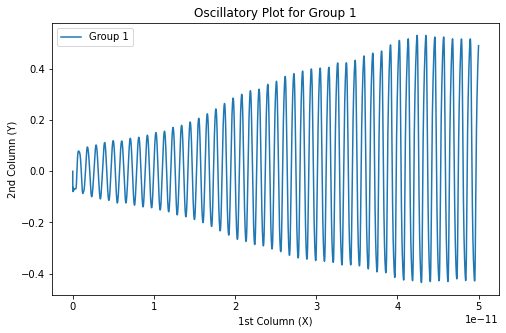

Group 2 was not filtered out (Variance: 0.09098995532366257)


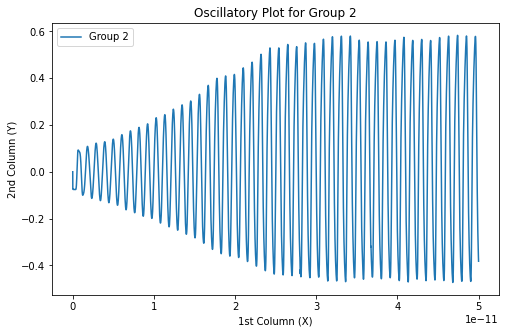

Group 3 was not filtered out (Variance: 0.44941962522299045)


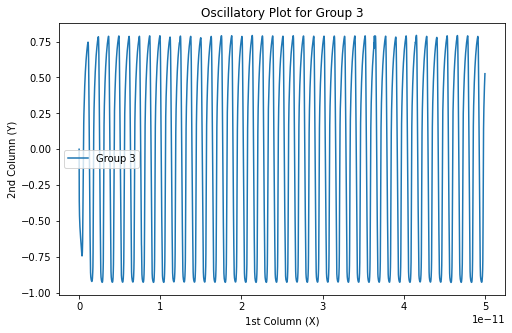

Group 4 was not filtered out (Variance: 0.37274120541260164)


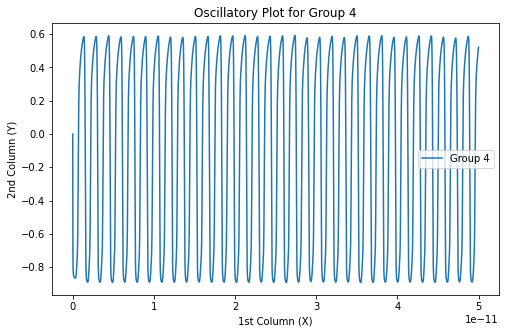

Group 5 was not filtered out (Variance: 0.23476446802197673)


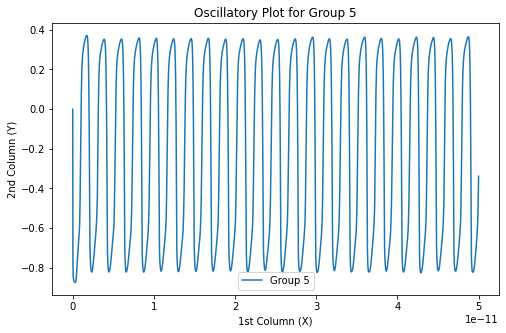

Group 6 was not filtered out (Variance: 0.17017588887265767)


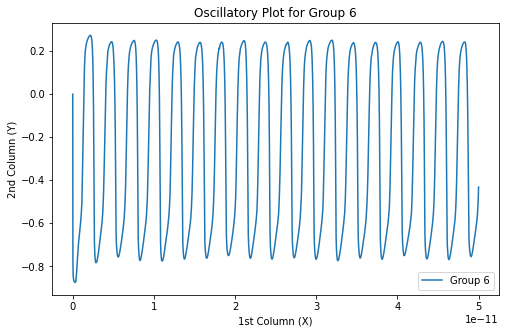

Group 7 was not filtered out (Variance: 0.060419353657527694)


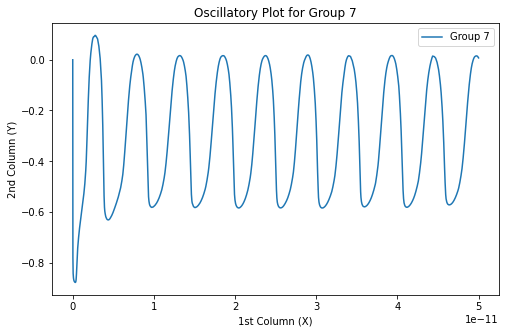

Group 8 was filtered out (Last 1500 values are too close).
Group 9 was filtered out (Variance: 0.0014677717789410199)
Group 10 was not filtered out (Variance: 0.007243287370971194)


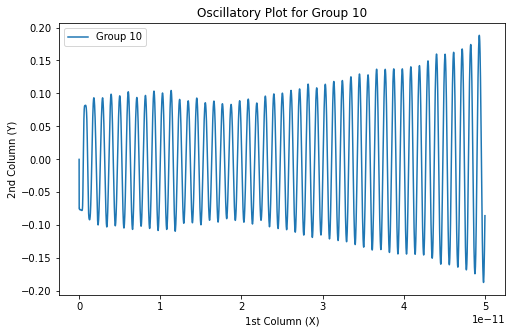

Group 11 was not filtered out (Variance: 0.029517000078539617)


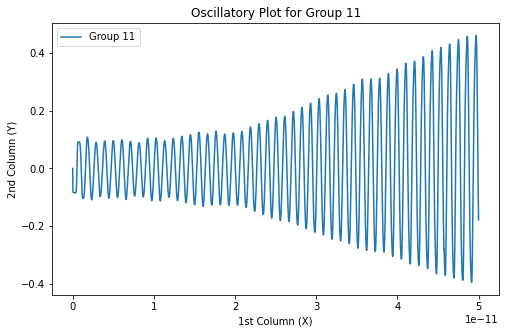

Group 12 was not filtered out (Variance: 0.3246947557375778)


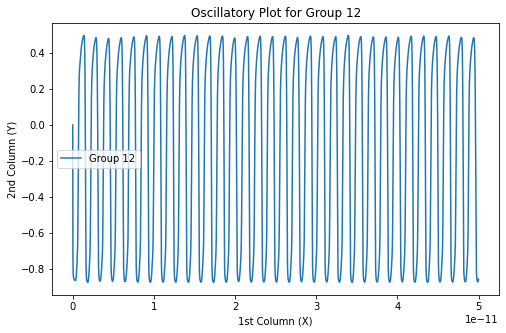

Group 13 was not filtered out (Variance: 0.14843746663231686)


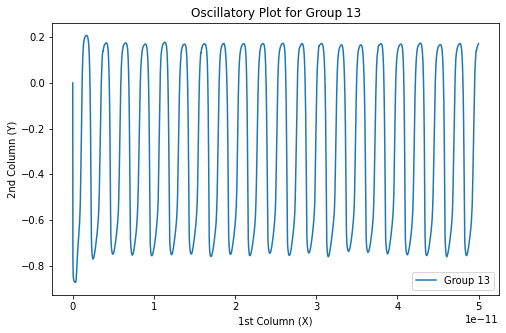

Group 14 was filtered out (Last 1500 values are too close).
Group 15 was filtered out (Last 1500 values are too close).
Group 16 was filtered out (Last 1500 values are too close).
Group 17 was filtered out (Last 1500 values are too close).
Group 18 was not filtered out (Variance: 0.0027526350757279506)


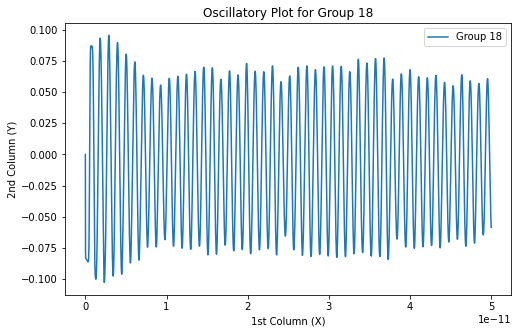

Group 19 was not filtered out (Variance: 0.033813044061716396)


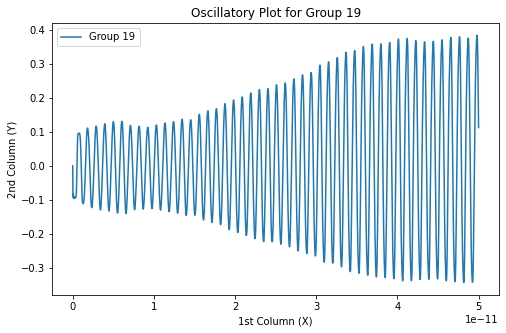

Group 20 was not filtered out (Variance: 0.09634293402828707)


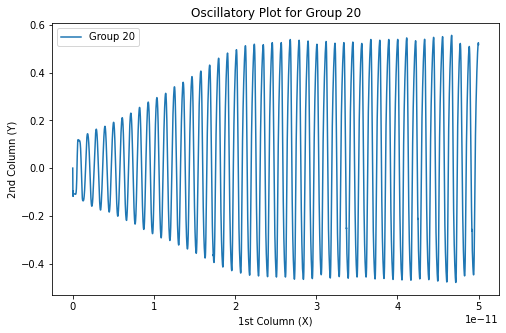

Group 21 was not filtered out (Variance: 0.16303370920343166)


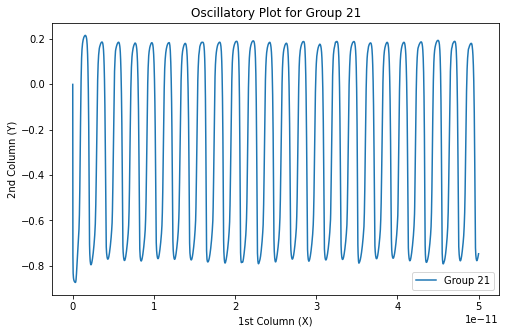

Group 22 was not filtered out (Variance: 0.04702462443419543)


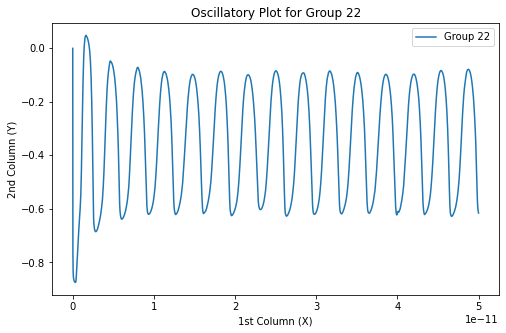

Group 23 was filtered out (Last 1500 values are too close).
Group 24 was filtered out (Last 1500 values are too close).
Group 25 was not filtered out (Variance: 0.003582812306075811)


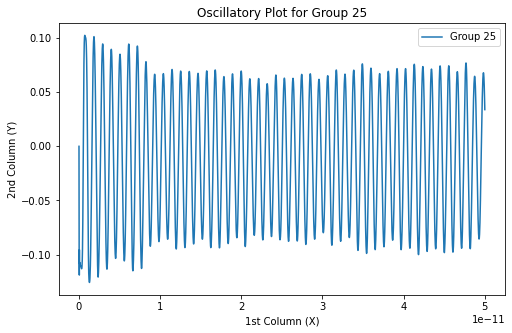

Group 26 was not filtered out (Variance: 0.003601874900078944)


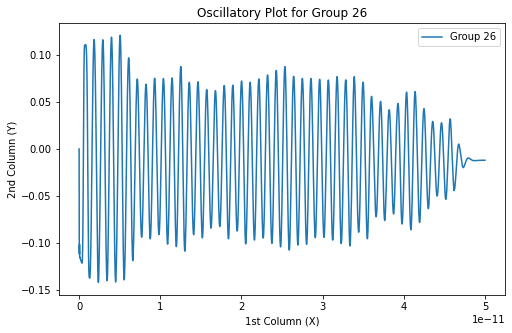

Group 27 was not filtered out (Variance: 0.054477288794912995)


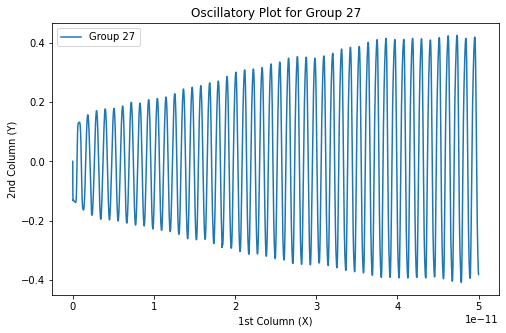

Group 28 was not filtered out (Variance: 0.10366008489058602)


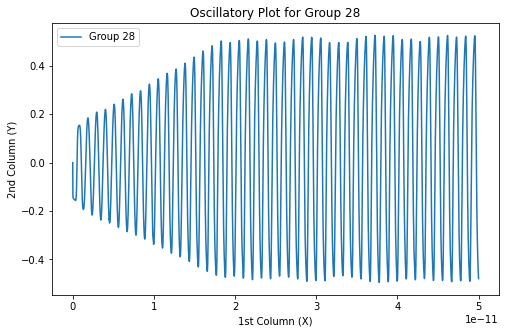

Group 29 was not filtered out (Variance: 0.1233505792436643)


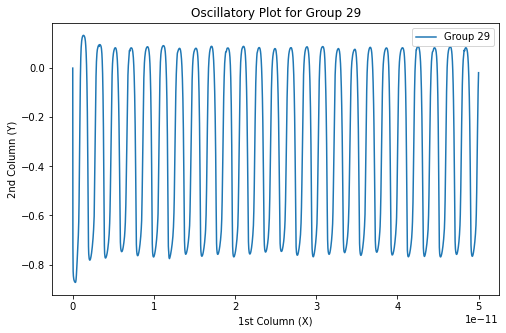

Group 30 was filtered out (Last 1500 values are too close).
Group 31 was filtered out (Variance: 0.0012933415637544487)
Group 32 was not filtered out (Variance: 0.02648395461307672)


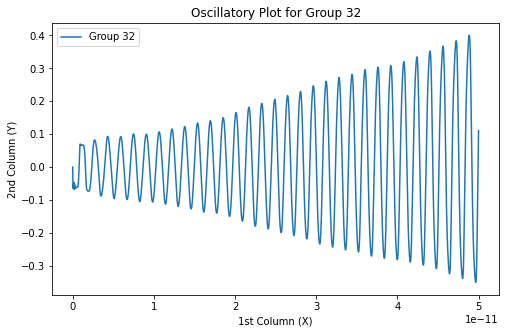

Group 33 was not filtered out (Variance: 0.062465600220326656)


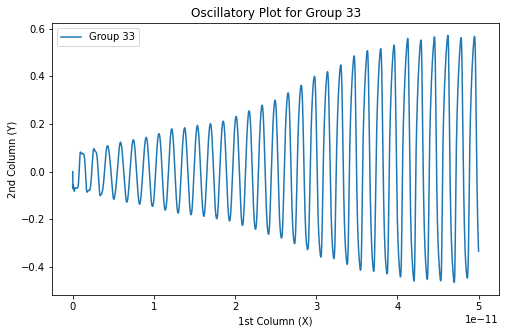

Group 34 was not filtered out (Variance: 0.2939004218840018)


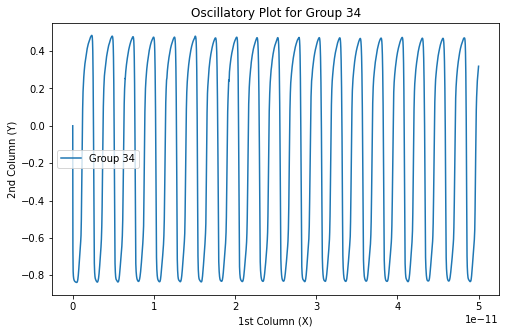

Group 35 was not filtered out (Variance: 0.1019534631559175)


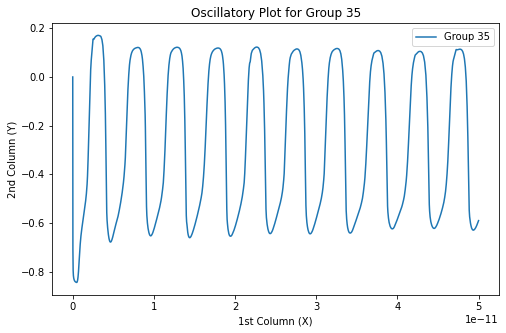

Group 36 was filtered out (Last 1500 values are too close).
Group 37 was not filtered out (Variance: 0.008406035090981152)


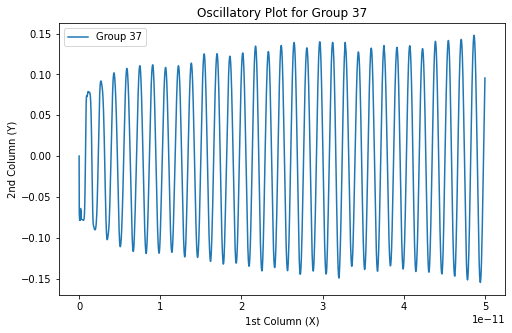

Group 38 was not filtered out (Variance: 0.21140618756399845)


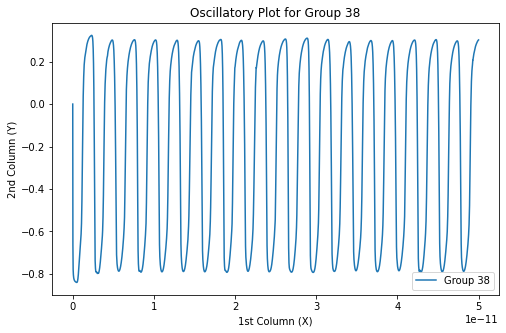

Group 39 was not filtered out (Variance: 0.13817476997455008)


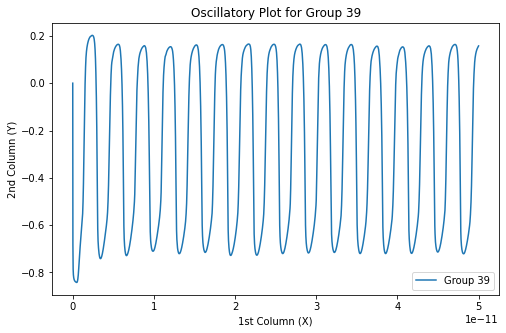

Group 40 was filtered out (Last 1500 values are too close).
Group 41 was filtered out (Last 1500 values are too close).
Group 42 was not filtered out (Variance: 0.0025188684290455257)


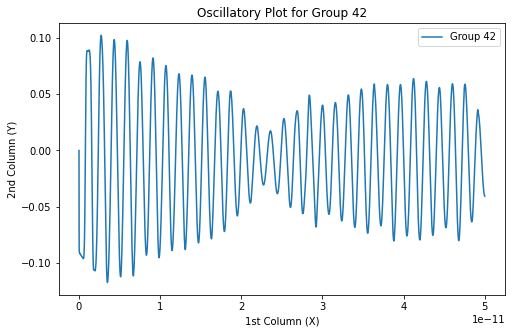

Group 43 was not filtered out (Variance: 0.004697483527116397)


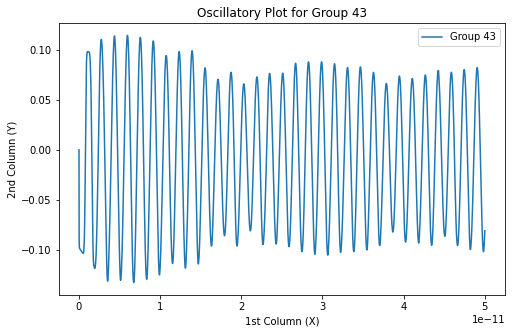

Group 44 was not filtered out (Variance: 0.14315972660765214)


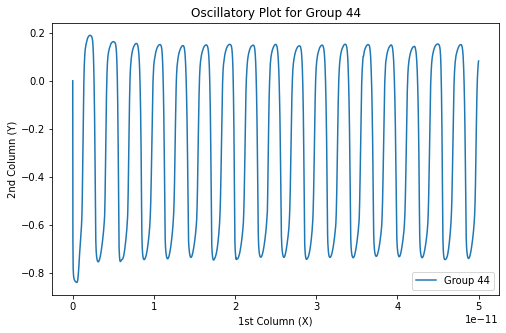

Group 45 was not filtered out (Variance: 0.03949164349008838)


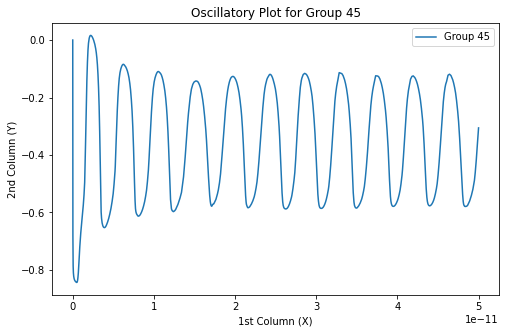

Group 46 was filtered out (Last 1500 values are too close).
Group 47 was not filtered out (Variance: 0.012025944772877734)


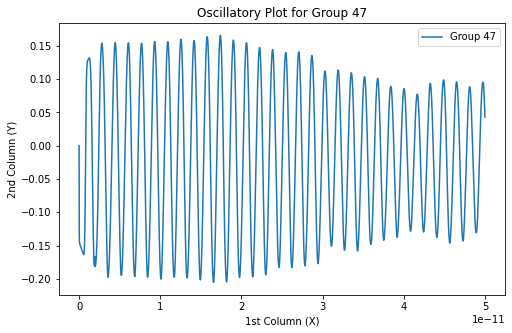

Group 48 was not filtered out (Variance: 0.02005047859960765)


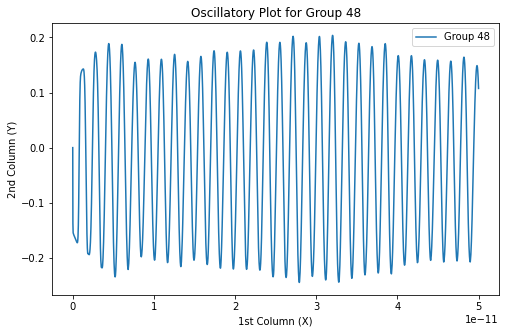

Group 49 was not filtered out (Variance: 0.06320229658943471)


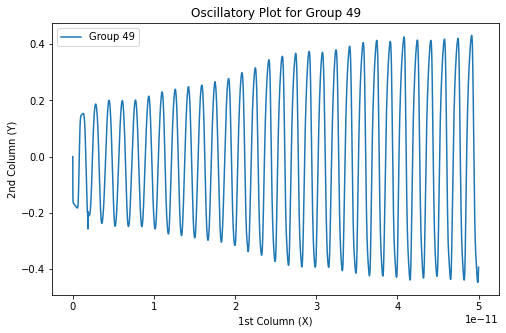

Group 50 was not filtered out (Variance: 0.04073869367682368)


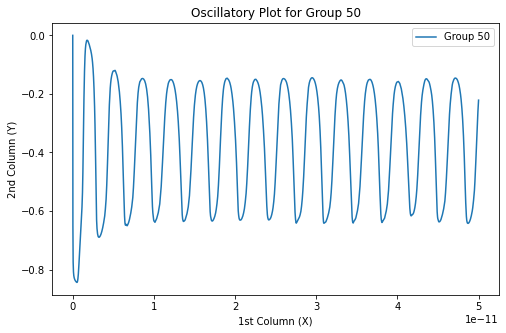

Group 51 was filtered out (Last 1500 values are too close).
Group 52 was not filtered out (Variance: 0.003972408916865683)


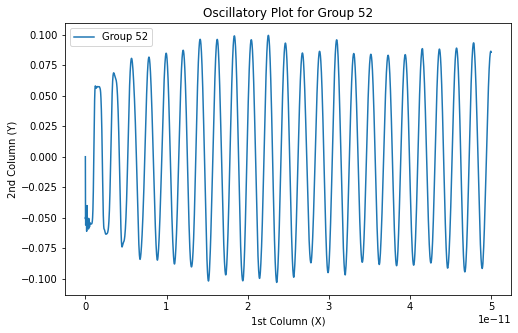

Group 53 was not filtered out (Variance: 0.014539780354950403)


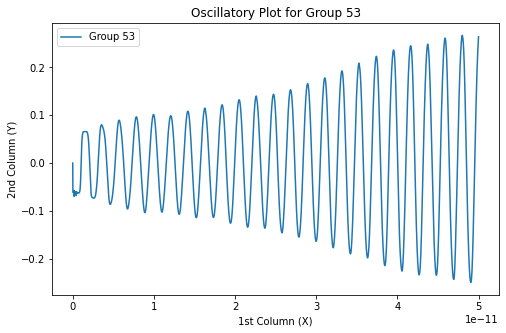

Group 54 was not filtered out (Variance: 0.1420286877660613)


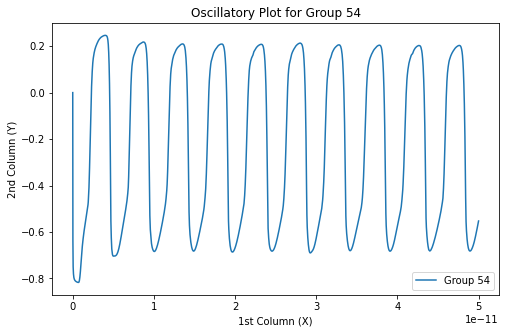

Group 55 was filtered out (Last 1500 values are too close).
Group 56 was filtered out (Variance: 0.0016277839042982908)
Group 57 was not filtered out (Variance: 0.0029627007471964197)


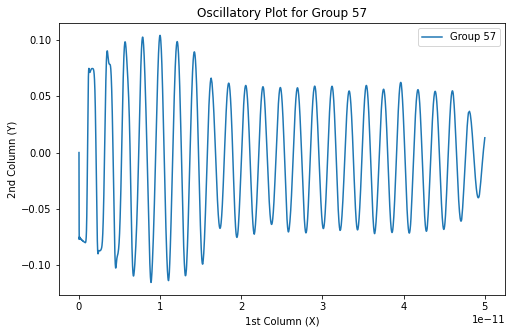

Group 58 was not filtered out (Variance: 0.0038307501002231917)


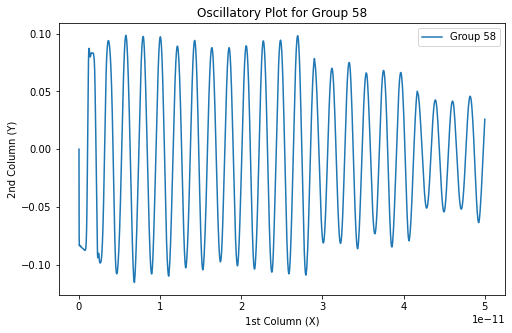

Group 59 was not filtered out (Variance: 0.009173338499703351)


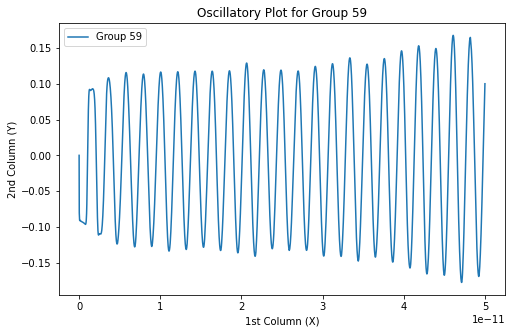

Group 60 was not filtered out (Variance: 0.1530587176214917)


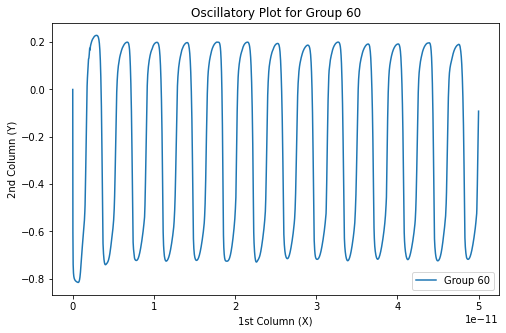

Group 61 was not filtered out (Variance: 0.06538979168113424)


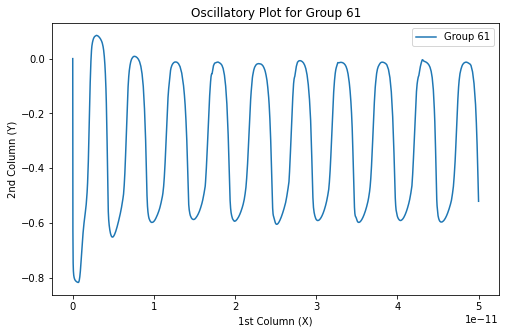

Group 62 was filtered out (Last 1500 values are too close).
Group 63 was not filtered out (Variance: 0.005034409222636737)


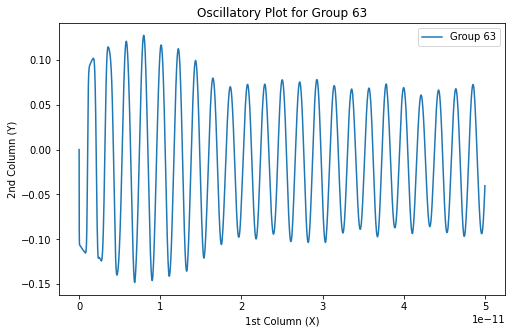

Group 64 was not filtered out (Variance: 0.029539961680832998)


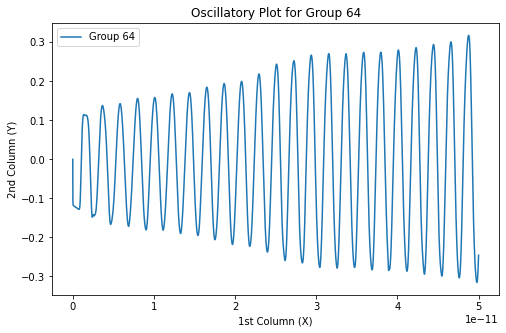

Group 65 was not filtered out (Variance: 0.06122223965979635)


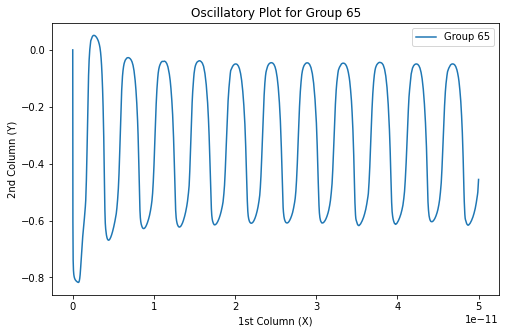

Group 66 was filtered out (Last 1500 values are too close).
Group 67 was not filtered out (Variance: 0.0068705998459324)


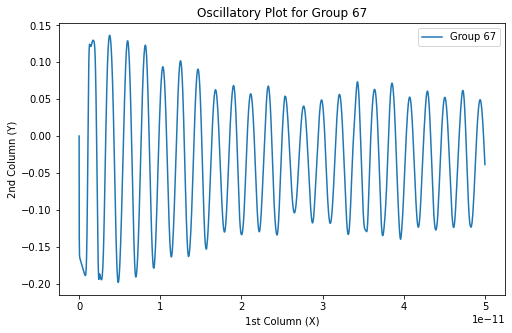

Group 68 was not filtered out (Variance: 0.008672003070247692)


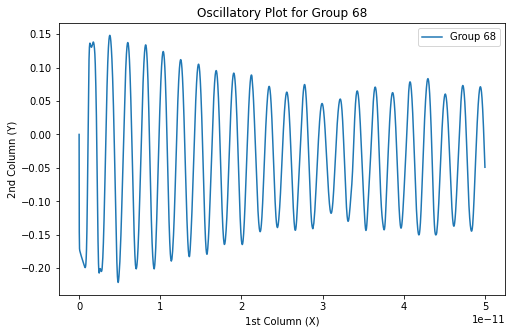

Group 69 was not filtered out (Variance: 0.04191692133121871)


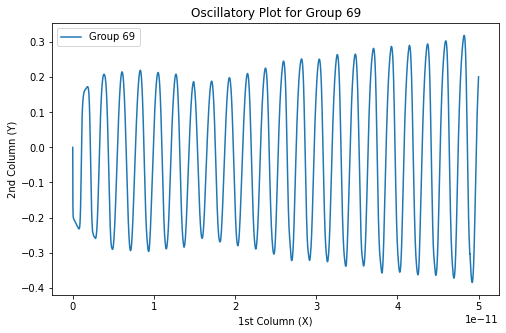

Group 70 was not filtered out (Variance: 0.04442225244385197)


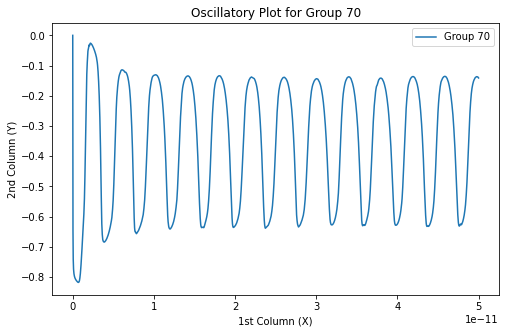

Group 71 was filtered out (Last 1500 values are too close).
Group 72 was filtered out (Last 1500 values are too close).
Group 73 was not filtered out (Variance: 0.003588492376339452)


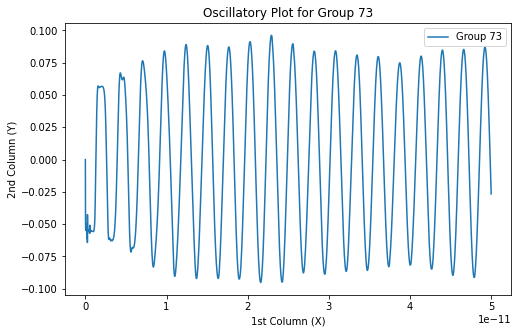

Group 74 was not filtered out (Variance: 0.010723355934401511)


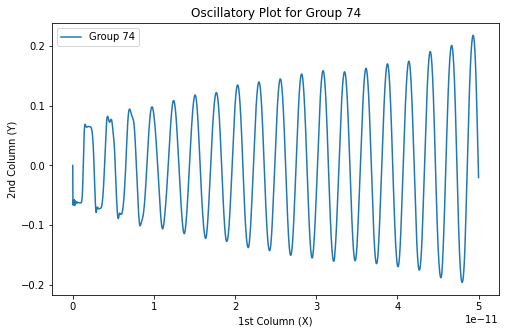

Group 75 was not filtered out (Variance: 0.01291596746665619)


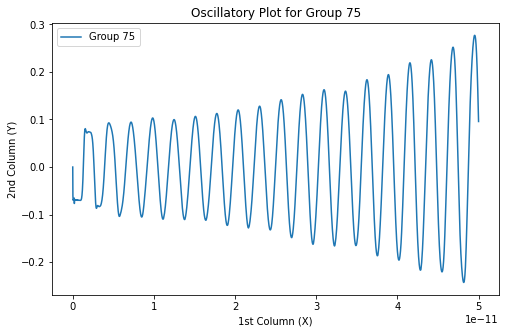

Group 76 was not filtered out (Variance: 0.23557207381432027)


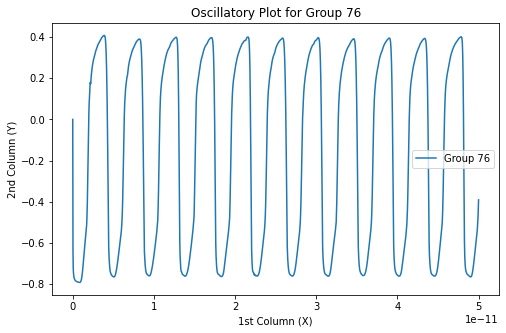

Group 77 was not filtered out (Variance: 0.10309297320641664)


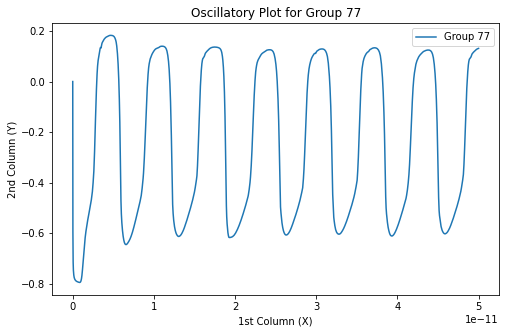

Group 78 was filtered out (Last 1500 values are too close).
Group 79 was not filtered out (Variance: 0.0037761220643214204)


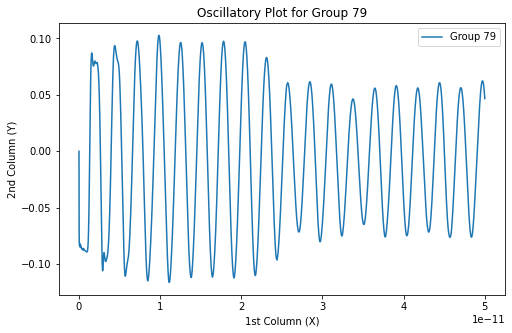

Group 80 was not filtered out (Variance: 0.00952366809803622)


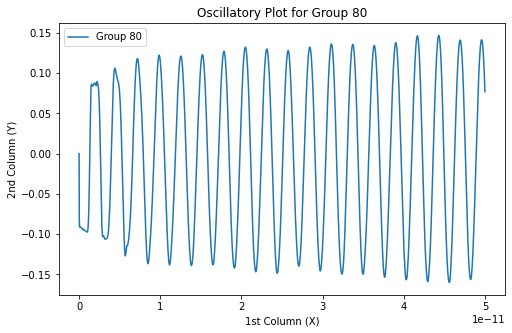

Group 81 was filtered out (Last 1500 values are too close).
Group 82 was not filtered out (Variance: 0.10166692407839348)


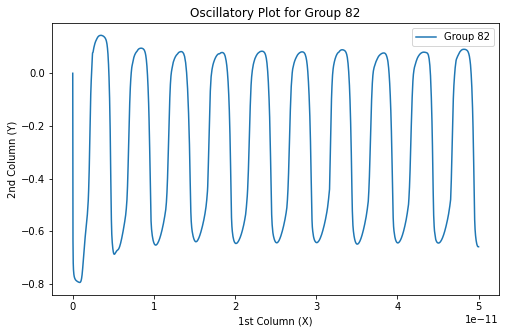

Group 83 was not filtered out (Variance: 0.008252934183104249)


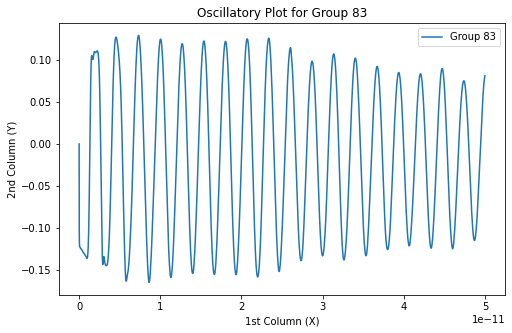

Group 84 was not filtered out (Variance: 0.020264760789439035)


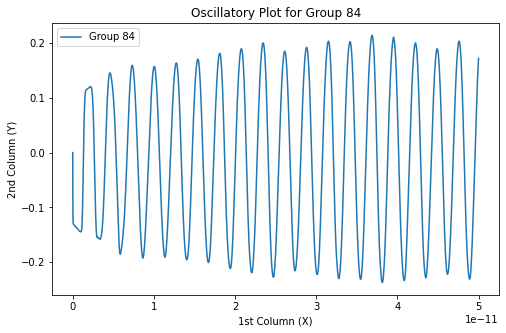

Group 85 was not filtered out (Variance: 0.04667771972645389)


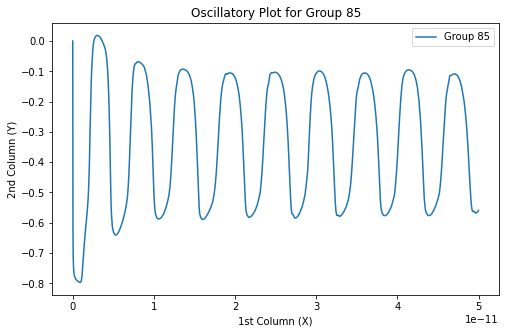

Group 86 was filtered out (Last 1500 values are too close).
Group 87 was not filtered out (Variance: 0.010745204552252495)


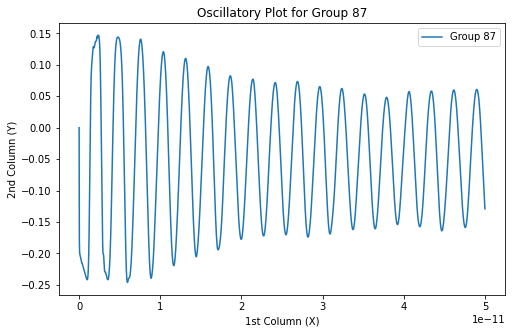

Group 88 was not filtered out (Variance: 0.011764895277113894)


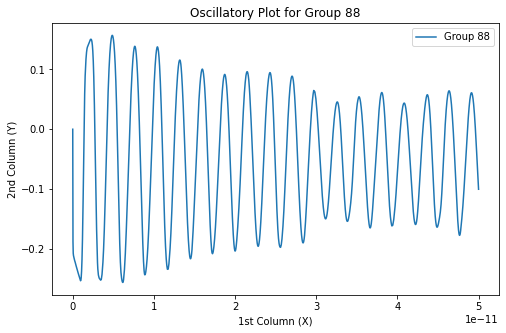

Group 89 was not filtered out (Variance: 0.019855947046398925)


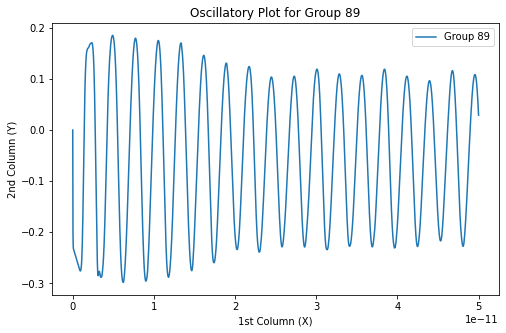

Group 90 was not filtered out (Variance: 0.05725104081582695)


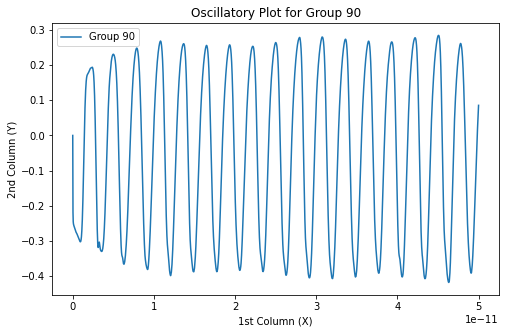

Group 91 was not filtered out (Variance: 0.08320484688055867)


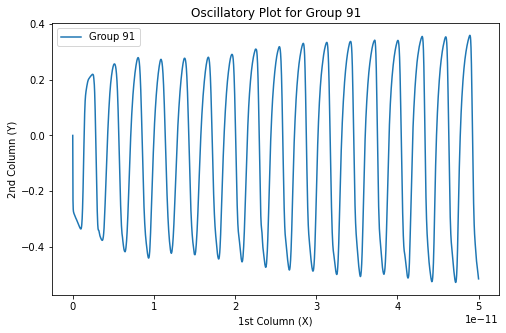

Group 92 was not filtered out (Variance: 0.022943164043276596)


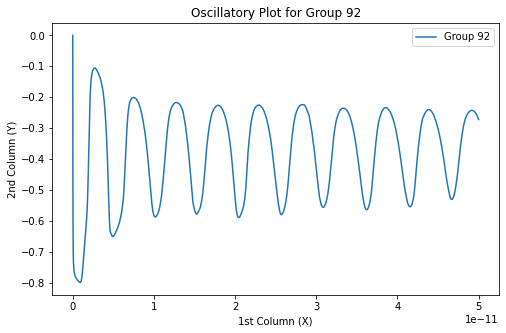

Group 93 was filtered out (Last 1500 values are too close).
Group 94 was filtered out (Last 1500 values are too close).
Group 95 was filtered out (Last 1500 values are too close).
Group 96 was not filtered out (Variance: 0.003582812306075811)


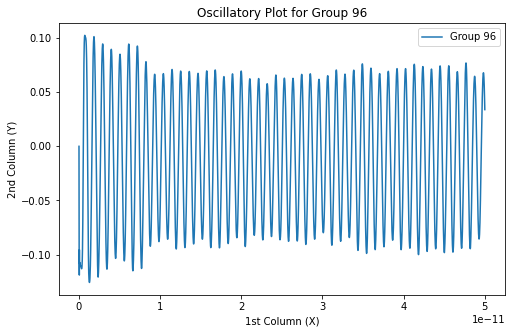

Group 97 was not filtered out (Variance: 0.003601874900078944)


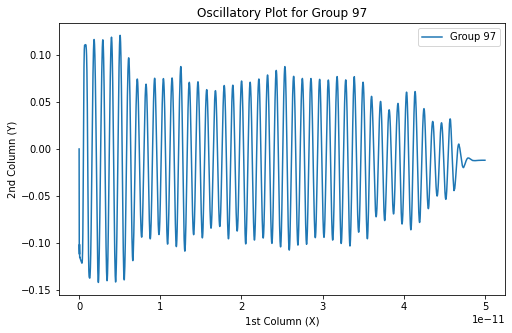

Group 98 was not filtered out (Variance: 0.054477288794912995)


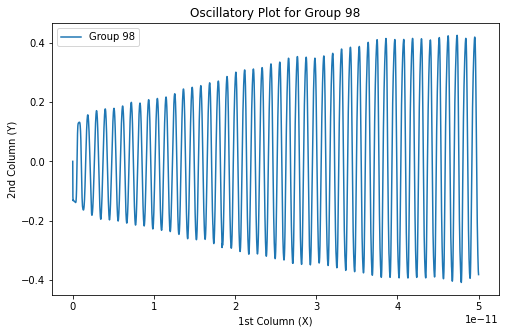

Group 99 was not filtered out (Variance: 0.10366008489058602)


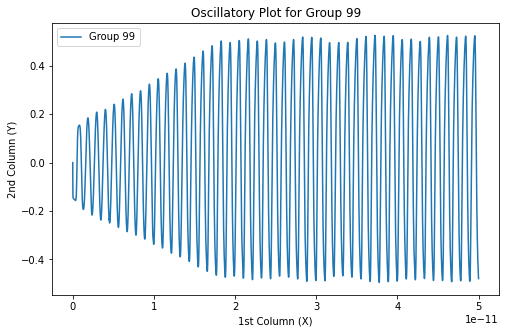

Group 100 was not filtered out (Variance: 0.1233505792436643)


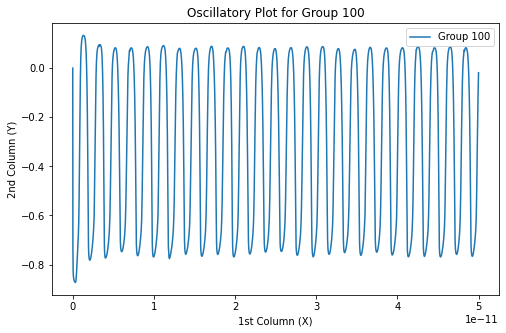

Group 101 was filtered out (Last 1500 values are too close).
Group 102 was not filtered out (Variance: 0.0031290111388469935)


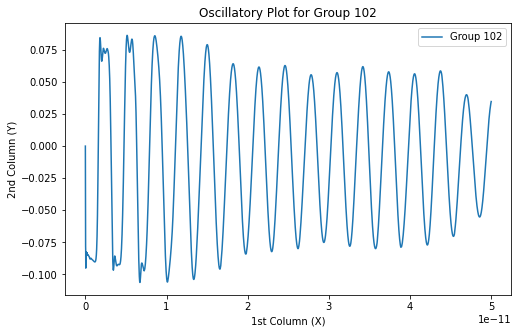

Group 103 was not filtered out (Variance: 0.004240495386689255)


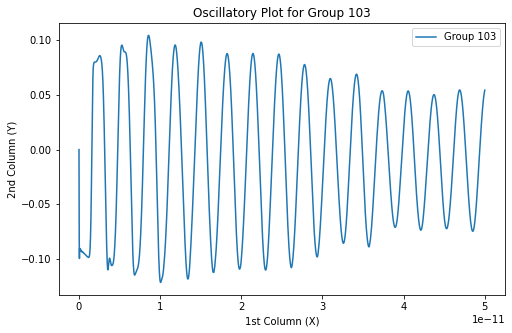

Group 104 was not filtered out (Variance: 0.004521135261142443)


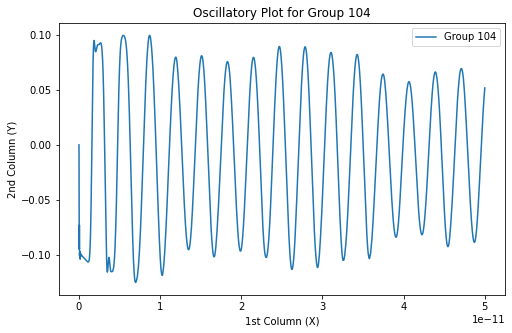

Group 105 was not filtered out (Variance: 0.014339838198883086)


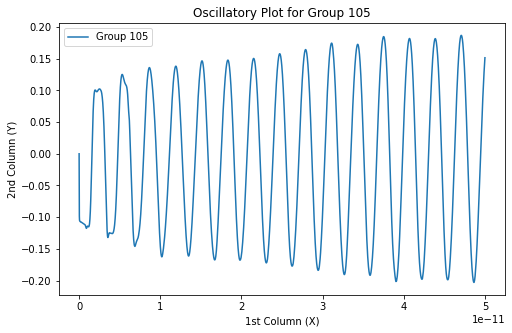

Group 106 was not filtered out (Variance: 0.053143228154220686)


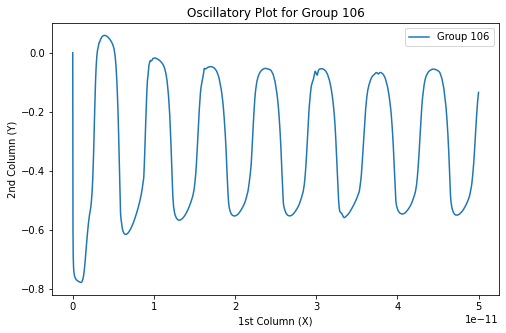

Group 107 was filtered out (Last 1500 values are too close).
Group 108 was not filtered out (Variance: 0.01918670174627204)


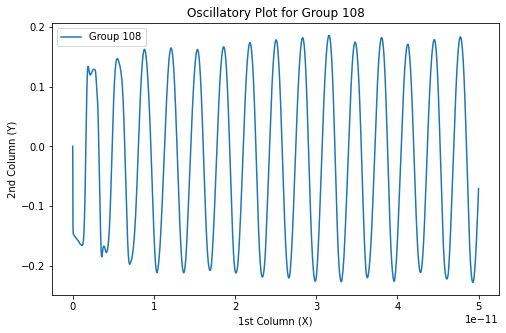

Group 109 was not filtered out (Variance: 0.0396526773261077)


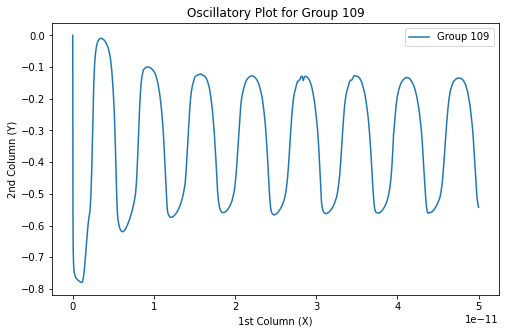

Group 110 was filtered out (Last 1500 values are too close).
Group 111 was not filtered out (Variance: 0.02302096223372335)


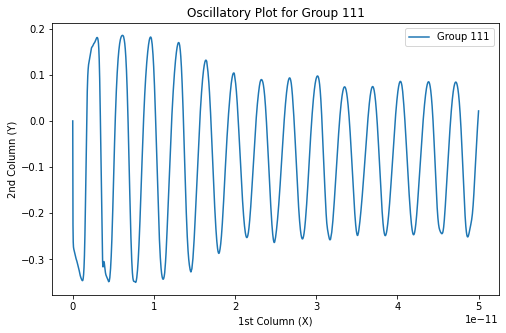

Group 112 was not filtered out (Variance: 0.028318259110461732)


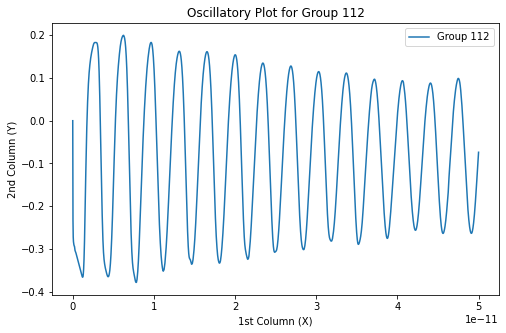

Group 113 was not filtered out (Variance: 0.029129263787514282)


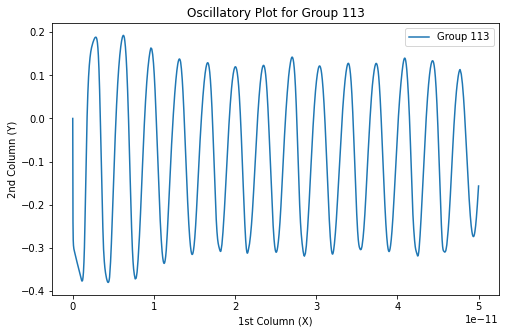

Group 114 was not filtered out (Variance: 0.02734793123082307)


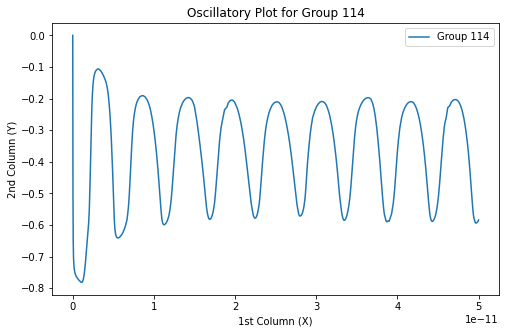

Group 115 was not filtered out (Variance: 0.0136535119279875)


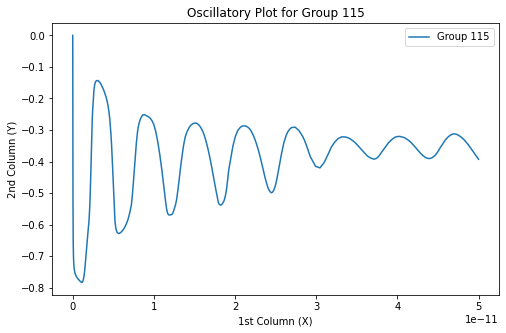

Group 116 was filtered out (Last 1500 values are too close).
Group 117 was filtered out (Last 1500 values are too close).
Group 118 was not filtered out (Variance: 0.014397869993231938)


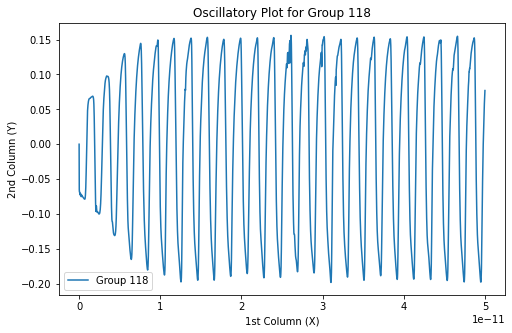

Group 119 was not filtered out (Variance: 0.03706408714508306)


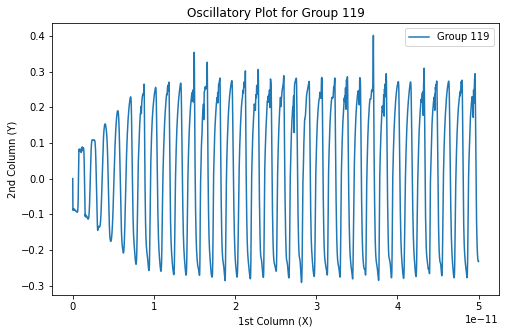

Group 120 was not filtered out (Variance: 0.06051013279051455)


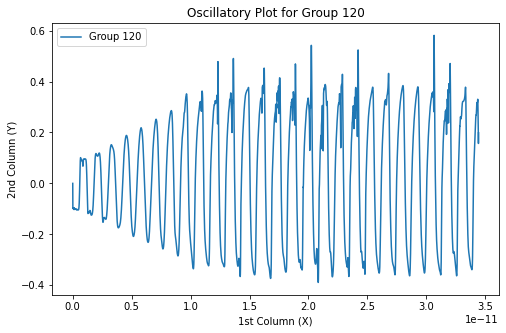

Group 121 was not filtered out (Variance: 0.027735525424007194)


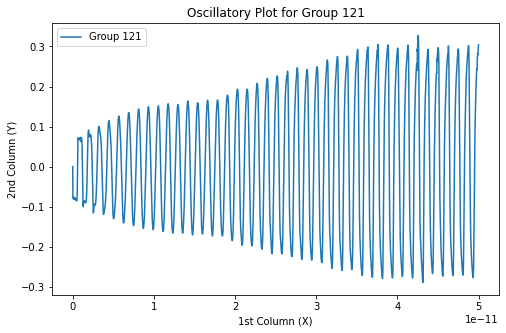

Group 122 was not filtered out (Variance: 0.06642529546355398)


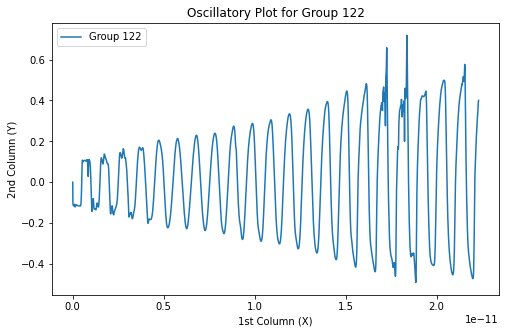

Group 123 was not filtered out (Variance: 0.08716277178175089)


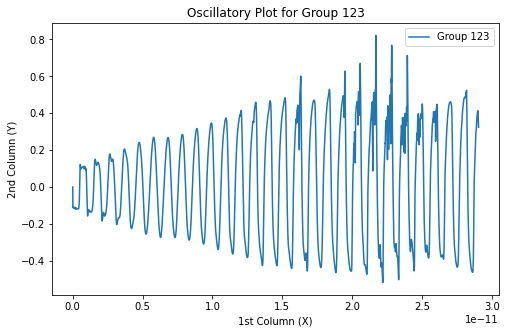

Group 124 was not filtered out (Variance: 0.0348859925133713)


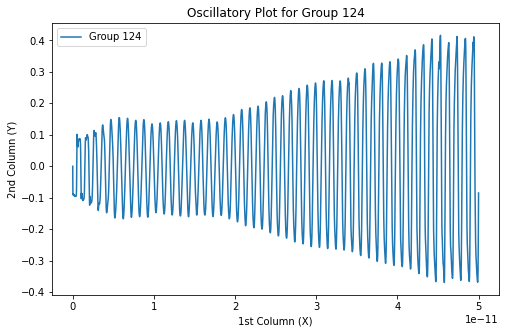

Group 125 was not filtered out (Variance: 0.0713213782958053)


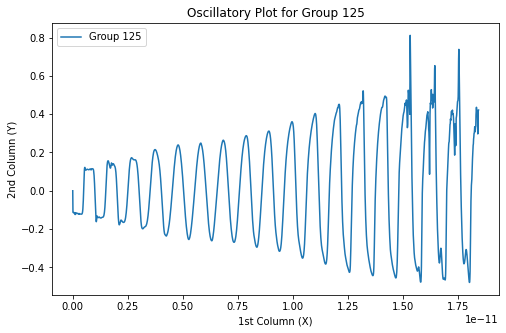

Group 126 was not filtered out (Variance: 0.06577597741789956)


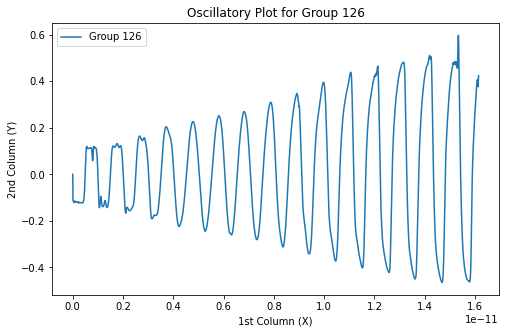

Group 127 was filtered out (Last 1500 values are too close).
Group 128 was not filtered out (Variance: 0.2488483054104069)


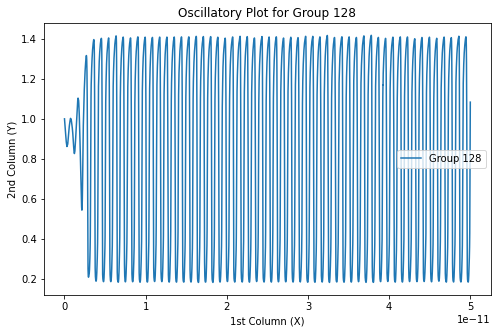

Group 129 was not filtered out (Variance: 0.1580076065533404)


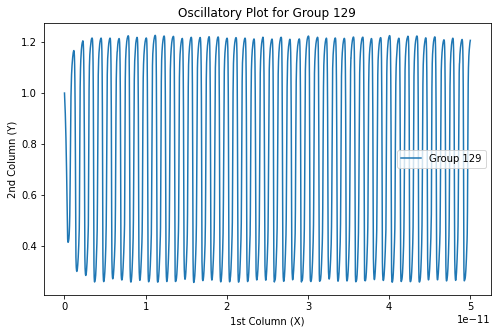

Group 130 was not filtered out (Variance: 0.1580076065533404)


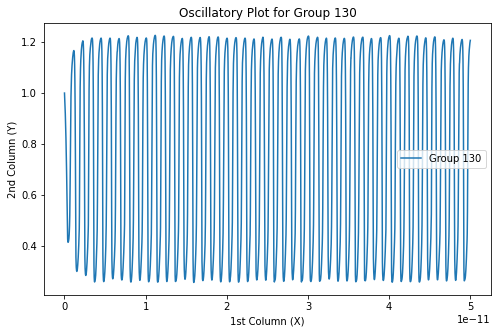

Group 131 was filtered out (Last 1500 values are too close).
Group 132 was filtered out (Last 1500 values are too close).
Group 133 was not filtered out (Variance: 0.23179595598251168)


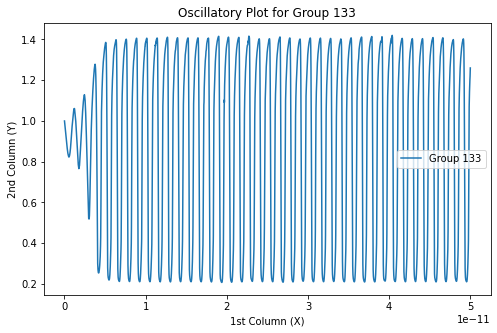

Group 134 was not filtered out (Variance: 0.05706178479900191)


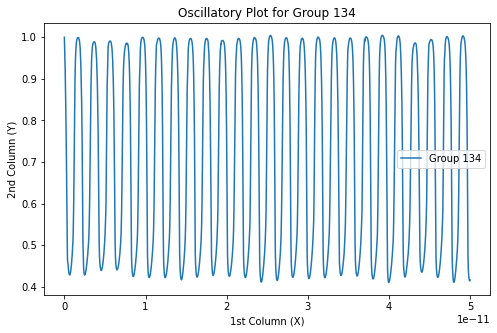

Group 135 was filtered out (Last 1500 values are too close).
Group 136 was filtered out (Last 1500 values are too close).
Group 137 was not filtered out (Variance: 0.23890895664383635)


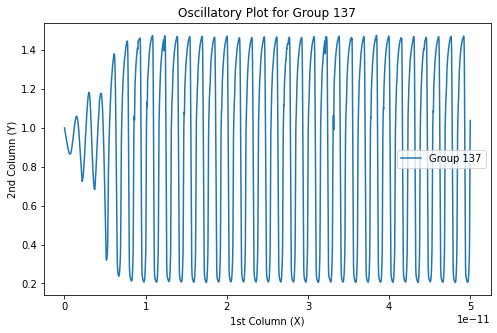

Group 138 was not filtered out (Variance: 0.20983035106508344)


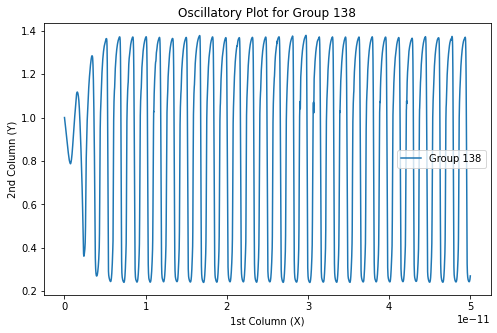

Group 139 was not filtered out (Variance: 0.03242001608703479)


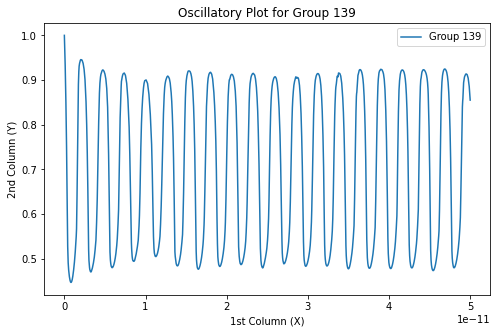

Group 140 was filtered out (Last 1500 values are too close).
Group 141 was filtered out (Last 1500 values are too close).
Group 142 was not filtered out (Variance: 0.20700049692285882)


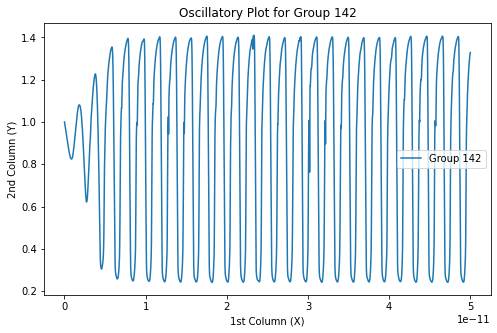

Group 143 was not filtered out (Variance: 0.02511368179123646)


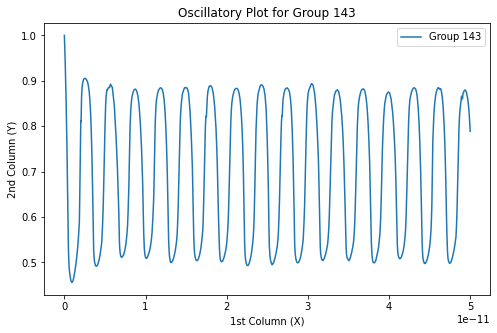

Group 144 was filtered out (Last 1500 values are too close).
Group 145 was filtered out (Last 1500 values are too close).
Group 146 was not filtered out (Variance: 0.17441290416810878)


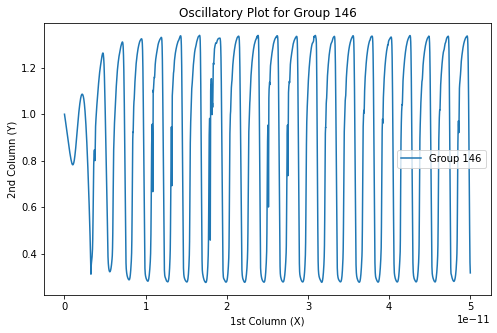

Group 147 was not filtered out (Variance: 0.026678276655167473)


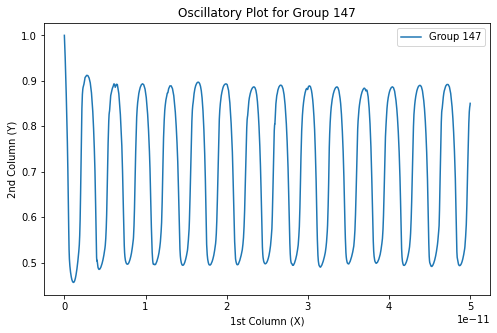

Group 148 was filtered out (Last 1500 values are too close).
Group 149 was filtered out (Last 1500 values are too close).
Group 150 was not filtered out (Variance: 0.22977503883198144)


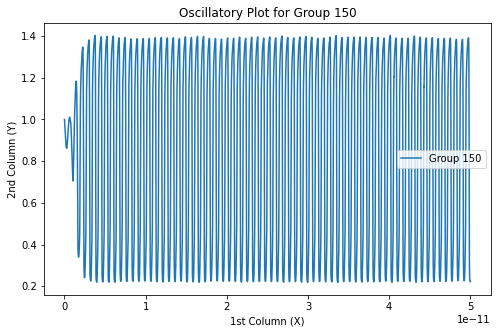

Group 151 was not filtered out (Variance: 0.15360520657707302)


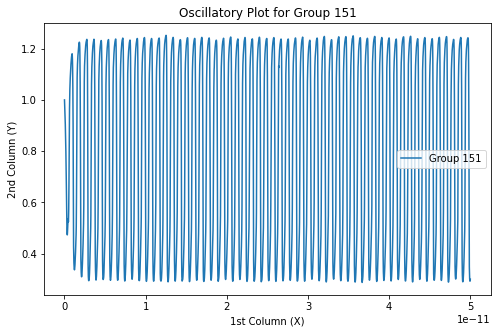

Group 152 was not filtered out (Variance: 0.07980730159470058)


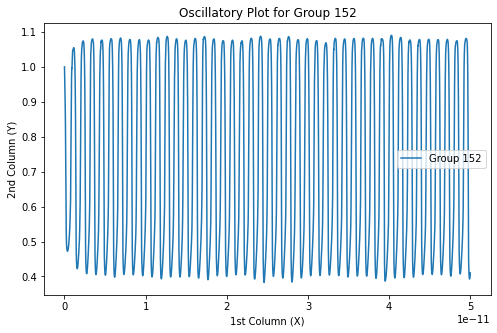

Group 153 was filtered out (Last 1500 values are too close).
Group 154 was filtered out (Last 1500 values are too close).
Group 155 was not filtered out (Variance: 0.23342899954131877)


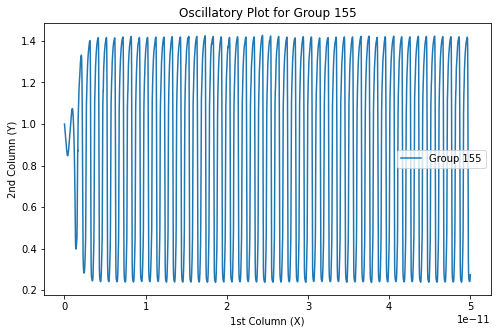

Group 156 was not filtered out (Variance: 0.06843080926311393)


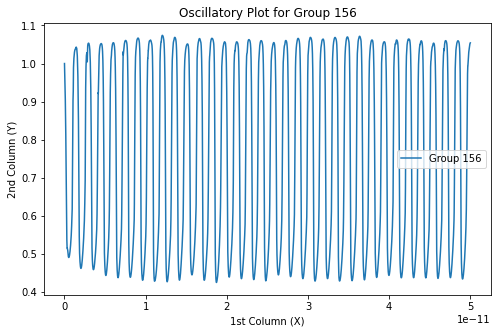

Group 157 was not filtered out (Variance: 0.012843770715909402)


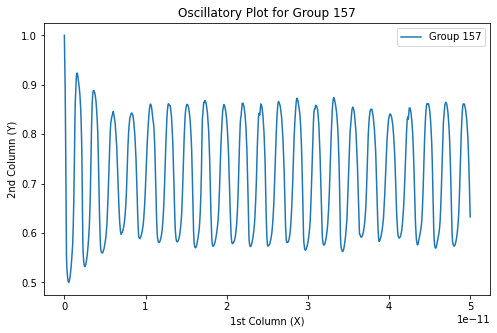

Group 158 was filtered out (Last 1500 values are too close).
Group 159 was filtered out (Last 1500 values are too close).
Group 160 was not filtered out (Variance: 0.20223215376530088)


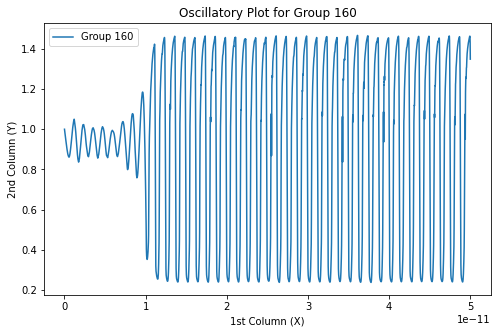

Group 161 was not filtered out (Variance: 0.0756204016464507)


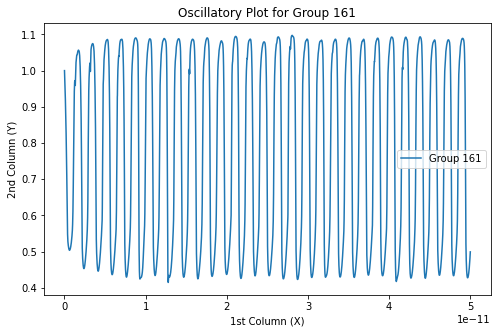

Group 162 was not filtered out (Variance: 0.03674748050545844)


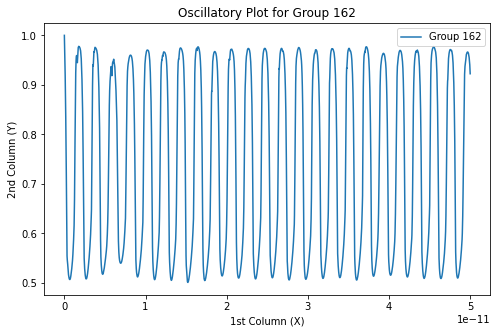

Group 163 was filtered out (Last 1500 values are too close).
Group 164 was filtered out (Last 1500 values are too close).
Group 165 was not filtered out (Variance: 0.2125759491016128)


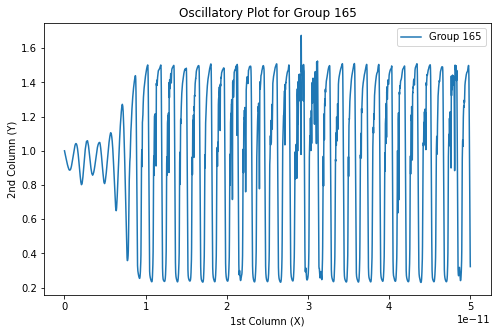

Group 166 was not filtered out (Variance: 0.022464835089335493)


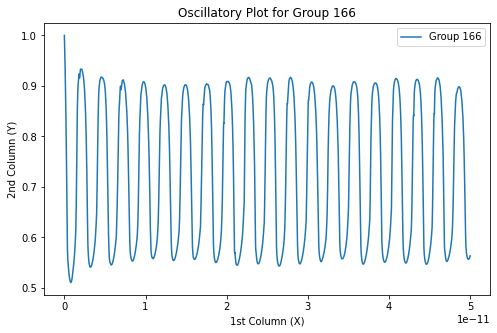

Group 167 was filtered out (Last 1500 values are too close).
Group 168 was filtered out (Last 1500 values are too close).
Group 169 was not filtered out (Variance: 0.22081314826391507)


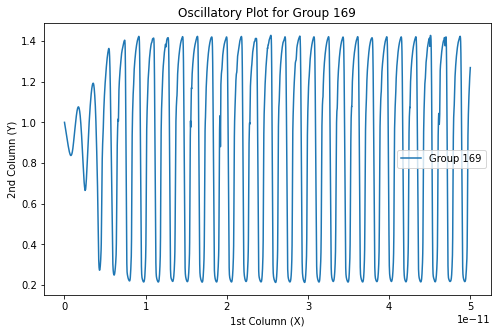

Group 170 was not filtered out (Variance: 0.17742359159087265)


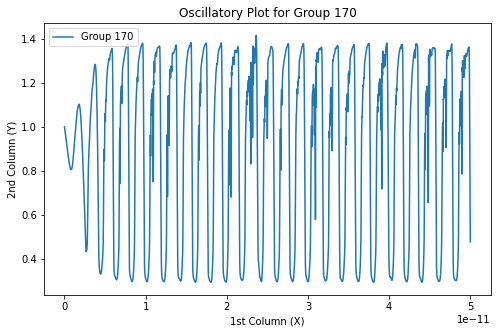

Group 171 was not filtered out (Variance: 0.018413240392297168)


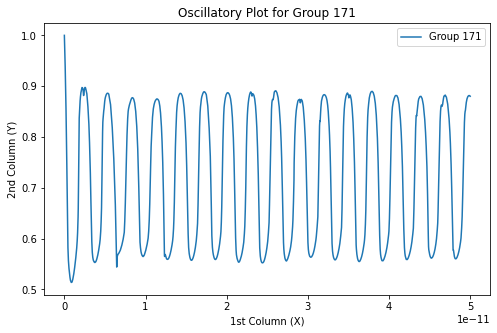

Group 172 was filtered out (Last 1500 values are too close).
Group 173 was filtered out (Last 1500 values are too close).
Group 174 was not filtered out (Variance: 0.2518013642405957)


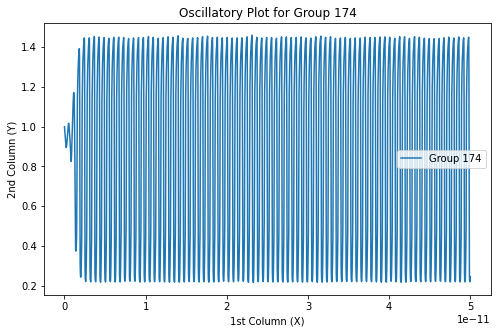

Group 175 was not filtered out (Variance: 0.047105608195293976)


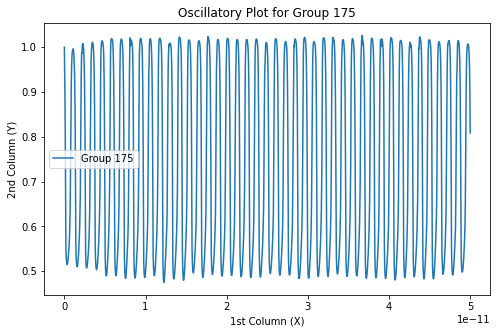

Group 176 was filtered out (Last 1500 values are too close).
Group 177 was filtered out (Last 1500 values are too close).
Group 178 was not filtered out (Variance: 0.22143934877240237)


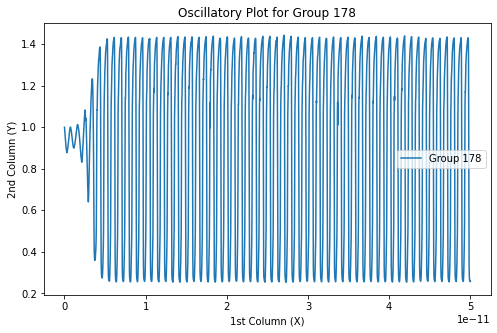

Group 179 was not filtered out (Variance: 0.10168134920086297)


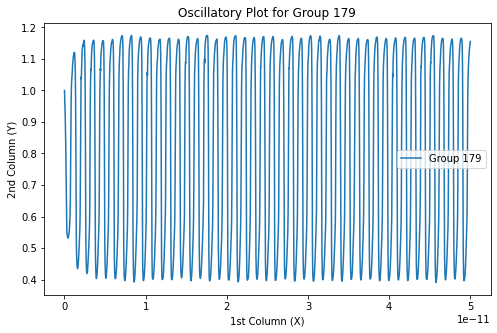

Group 180 was not filtered out (Variance: 0.030998393098597227)


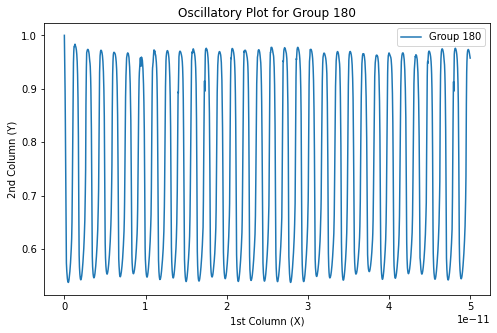

Group 181 was filtered out (Last 1500 values are too close).
Group 182 was filtered out (Last 1500 values are too close).
Group 183 was not filtered out (Variance: 0.2332307822244151)


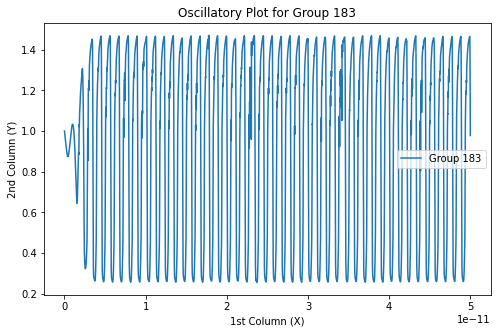

Group 184 was not filtered out (Variance: 0.12317082873812271)


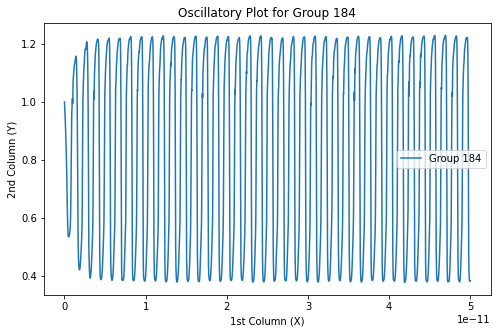

Group 185 was not filtered out (Variance: 0.03837476493384479)


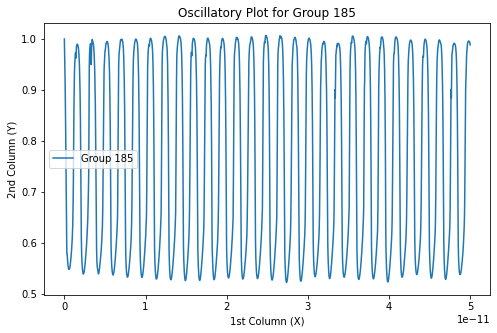

Group 186 was filtered out (Last 1500 values are too close).
Group 187 was filtered out (Last 1500 values are too close).
Group 188 was filtered out (Last 1500 values are too close).
Group 189 was not filtered out (Variance: 0.24106754220845586)


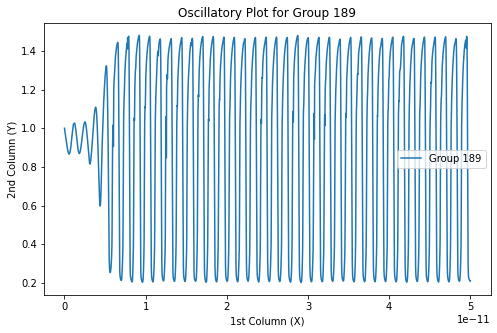

Group 190 was not filtered out (Variance: 0.23237835876937749)


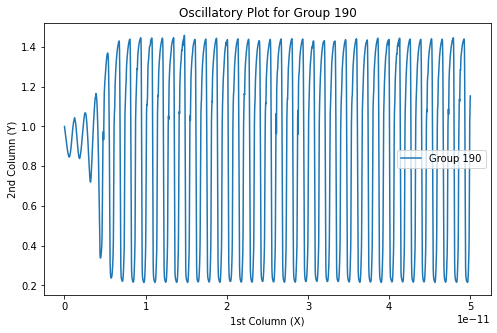

Group 191 was not filtered out (Variance: 0.051248173970339726)


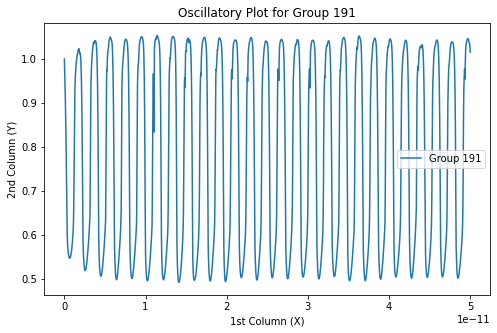

Group 192 was not filtered out (Variance: 0.020498611165901803)


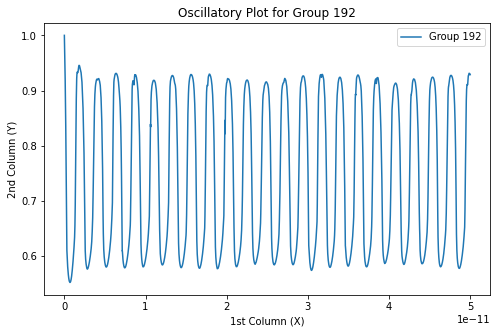

Group 193 was filtered out (Last 1500 values are too close).
Group 194 was filtered out (Last 1500 values are too close).
Group 195 was not filtered out (Variance: 0.24347322848986946)


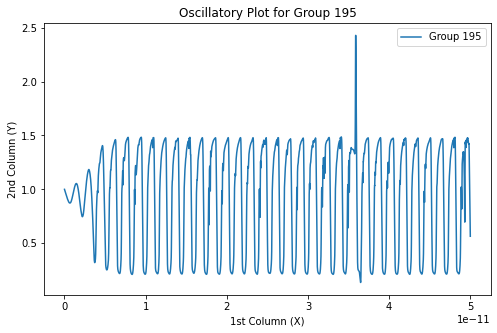

Group 196 was not filtered out (Variance: 0.2330671448817016)


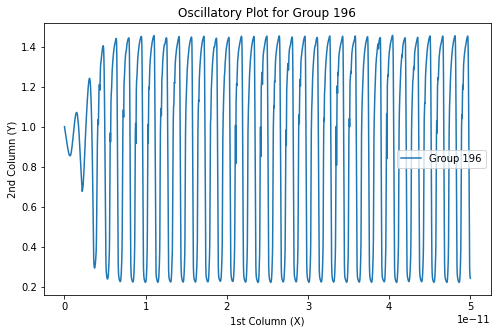

Group 197 was not filtered out (Variance: 0.013318790569629788)


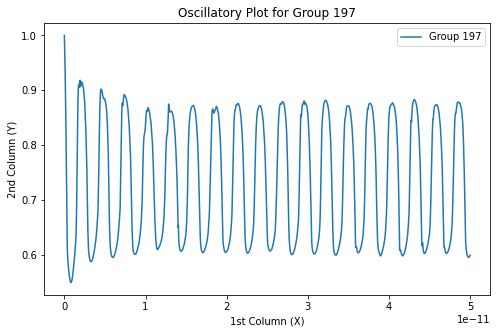

Group 198 was filtered out (Last 1500 values are too close).
Group 199 was filtered out (Last 1500 values are too close).
Group 200 was not filtered out (Variance: 0.25134647741002586)


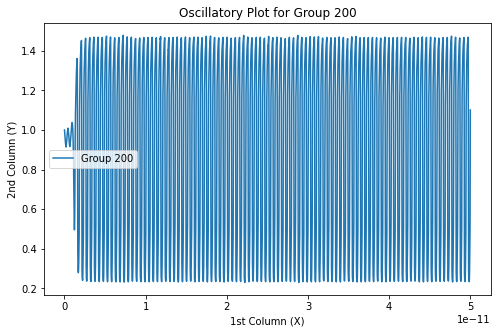

Group 201 was not filtered out (Variance: 0.1309167047419195)


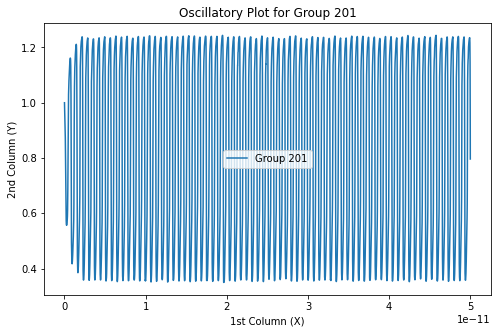

Group 202 was not filtered out (Variance: 0.04189930532220952)


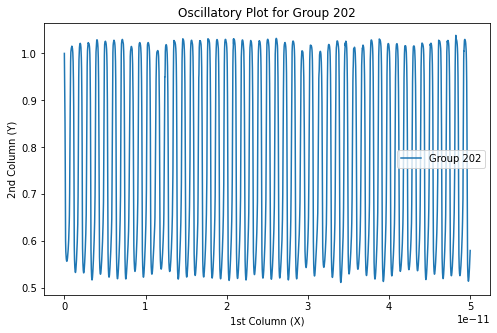

Group 203 was filtered out (Last 1500 values are too close).
Group 204 was filtered out (Last 1500 values are too close).
Group 205 was filtered out (Last 1500 values are too close).
Total groups filtered in (oscillatory): 138
Total groups filtered out (flat or straight): 68


In [7]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# Assuming df is your DataFrame
zero_mask = df.iloc[:, 0] == 0

# Use the mask to create group labels: increment the group number on each zero
df['group'] = zero_mask.cumsum()

# Function to check if the last segment of values is close to each other
def is_flat(y_values, last_n=1500, flat_threshold=0.01):
    if len(y_values) < last_n:
        return False  # Not enough values to check

    # Check the standard deviation of the last `last_n` values
    std_dev = np.std(y_values[-last_n:])
    return std_dev < flat_threshold  # Returns True if the last segment is flat

# Function to check if a curve is "oscillatory" or "wavy"
def is_oscillatory(y_values, variance_threshold=0.002, min_peaks=3, min_distance=2):
    # Calculate variance
    variance = np.var(y_values)
    if variance < variance_threshold:
        return False  # Too little variation

    # Find peaks in the data
    peaks, _ = find_peaks(y_values, distance=min_distance)
    valleys, _ = find_peaks(-y_values, distance=min_distance)
    
    # Count total peaks and valleys
    total_extrema = len(peaks) + len(valleys)
    
    # Check if the total number of extrema exceeds a minimum threshold
    if total_extrema < min_peaks:
        return False  # Not enough oscillations

    return True  # The curve is considered oscillatory

# Group by the 'group' column
grouped = df.groupby('group')

# Initialize counters for filtered in and filtered out groups
filtered_in_count = 0
filtered_out_count = 0

# List to store the group numbers that are filtered in (oscillatory)
filtered_in_groups = []

# Define the threshold value for the 1st column
threshold_value = 50e-12

# Loop through each group and filter based on the oscillatory check
for group, group_df in grouped:
    # Filter out rows where the first column exceeds the threshold
    group_df = group_df[group_df.iloc[:, 0] <= threshold_value]

    # If the group has no data after filtering, skip it
    if group_df.empty:
        print(f'Group {group} has no values below the threshold {threshold_value}.')
        continue

    y_values = group_df.iloc[:, 1].values  # 2nd column

    # Check if the last segment is flat
    if is_flat(y_values):
        print(f'Group {group} was filtered out (Last {len(y_values[-1500:])} values are too close).')
        filtered_out_count += 1
        continue  # Skip further checks if the last segment is flat

    # Check if the curve is oscillatory
    if is_oscillatory(y_values):
        # Add the group to filtered-in list
        filtered_in_groups.append(group)
        
        # Initialize a new figure for each group
        plt.figure(figsize=(8, 5))
        
        # Plot the group
        plt.plot(group_df.iloc[:, 0], group_df.iloc[:, 1], linestyle='-', label=f'Group {group}')
        
        # Add labels and title
        plt.xlabel('1st Column (X)')
        plt.ylabel('2nd Column (Y)')
        plt.title(f'Oscillatory Plot for Group {group}')
        print(f'Group {group} was not filtered out (Variance: {np.var(y_values)})')
        plt.legend()
        
        # Show the plot
        plt.show()
        
        # Increment the filtered-in counter
        filtered_in_count += 1
    else:
        # Print out which groups were filtered
        print(f'Group {group} was filtered out (Variance: {np.var(y_values)})')
        # Increment the filtered-out counter
        filtered_out_count += 1

# After all groups are processed, print the results
print(f"Total groups filtered in (oscillatory): {filtered_in_count}")
print(f"Total groups filtered out (flat or straight): {filtered_out_count}")


In [8]:
# Now split the filtered-in groups into training and testing sets

# Step 1: Randomly select 50 groups (or fewer if there aren't 50)
selected_filtered_groups = np.random.choice(filtered_in_groups, size=min(50, len(filtered_in_groups)), replace=False)

# Step 2: Split the selected filtered groups into training and testing sets
train_groups, test_groups = train_test_split(selected_filtered_groups, test_size=0.2, random_state=42)

# Step 3: Select the rows belonging to the groups in the training and testing sets
train_df = df[df['group'].isin(train_groups)].drop(columns=['group'])
test_df = df[df['group'].isin(test_groups)].drop(columns=['group'])

# # If you want to keep the group information:
# test_df_with_group = test_df.copy()  # Avoid dropping 'group' column
# train_df_with_group = train_df.copy()  # Avoid dropping 'group' column

# test_df_with_group['group'] = df[df['group'].isin(test_groups)]['group']  # Add the group column back
# train_df_with_group['group'] = df[df['group'].isin(train_groups)]['group']  # Add the group column back

In [9]:
test_df_with_group = test_df.copy()  # Avoid dropping 'group' column
train_df_with_group = train_df.copy()  # Avoid dropping 'group' column
test_df_with_group['group'] = df[df['group'].isin(test_groups)]['group']  # Add the group column back
train_df_with_group['group'] = df[df['group'].isin(train_groups)]['group']  # Add the group column back

# Print the final train and test data shapes
print(f"Train set shape: {train_df.shape}")
print(f"Test set shape: {test_df.shape}")

Train set shape: (193499, 11)
Test set shape: (47241, 11)


In [10]:
print(train_groups)
print(test_groups)
print(unique_groups.shape)

[ 49  98  53  54 100  39 161 112  67  20  33  59 162 166  76 156  22 179
  29  77  10  73 126 200 103 133 114  27  18 125  42  11  25   2  99  44
 202 139 178  87]
[122 104 130 115 183 190  69  12  58  32]
(206,)


In [11]:
#X = df.iloc[:, [0, 2, 3, 4, 5, 6, 7, 8, 9, 10]].values  # First column for X
#X = df.iloc[:, 0].values[:, None]

# X = df.iloc[:, [0, 2, 3, 4, 5, 6, 7]].values
# Y = df.iloc[:, 1].values[:, None]  # Second column for Y

X_train = train_df.iloc[:, [0, 2, 3, 4, 5, 6, 7]].values
# X_train = train_df.iloc[:, 0].values[:, None]
Y_train = train_df.iloc[:, 1].values[:, None]  # Second column for Y

X_test = test_df.iloc[:, [0, 2, 3, 4, 5, 6, 7]].values
# X_test = test_df.iloc[:, 0].values[:, None]
Y_test = test_df.iloc[:, 1].values[:, None]  # Second column for Y

# Split the data into 1000 training and 1000 testing points
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, train_size=100000, test_size=10000, shuffle=True, random_state=42)

# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
#     X_train = X
#     Y_train = Y
#     X_test = X
#     Y_test = Y

In [12]:
print(X_train.shape)
print(X_test.shape)

(193499, 7)
(47241, 7)


In [19]:

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt\

import seaborn as sns

#from models_tf import Sampler, NN_FF

from sklearn.model_selection import train_test_split
import pandas as pd


if __name__ == '__main__':
    
    N_u = 1000
    #X_u = np.linspace(dom_coords[0, 0],
     #                 dom_coords[1, 0], N_u)[:, None]
    
    X_u = X_train
    
    a = 2*1e13
    #Y_u = u(X_u, a)
    
    Y_u = Y_train
    
    # Test data
    nn = 1000
    #X_star = np.linspace(dom_coords[0, 0], dom_coords[1, 0], nn)[:, None]
    #u_star = u(X_star, a)
    
    X_star = X_test
    u_star = Y_test
    
    # Define the model
    layers = [100, 100, 100, 1]
    sigma_t = 45   # Hyper-parameter of the Fourier features
    sigma_x = 5
    #model = NN_FF(layers, X_u, Y_u, a, u,  sigma)
    model = NN_FF(layers, X_u, Y_u, a,  X_star, u_star,  sigma_t, sigma_x)
    
    # Train the model for different epochs
    epoch_list = [10, 90, 10900]  # 1000 iterations in total
    u_pred_list = []

    for epoch in epoch_list:
        # Train the model
        model.train(nIter=epoch, log_NTK=True, log_weights=True)
        u_pred = model.predict_u(X_star)
        u_pred_list.append(u_pred)
        # Predictions
       

    # Evaulate the relative l2 error
    error_u = np.linalg.norm(u_star - u_pred, 2) / np.linalg.norm(u_star, 2)
    print('Relative L2 error_u: {:.2e}'.format(error_u))

#     # Create loggers for the eigenvalues of the NTK
#     lambda_K_log = []

#     # Restore the NTK
#     K_list = model.K_log

#     for k in range(len(K_list)):
#         K = K_list[k]

#         # Compute eigenvalues
#         lambda_K, eigvec_K = np.linalg.eig(K)
        
#         # Sort in descresing order
#         lambda_K = np.sort(np.real(lambda_K))[::-1]
        
#         # Store eigenvalues
#         lambda_K_log.append(lambda_K)
        
#     # Change of the NTK
#     kernel_diff_list = []
#     K0 = K_list[0]
#     for K in K_list:
#         diff = np.linalg.norm(K - K0) / np.linalg.norm(K0) 
#         kernel_diff_list.append(diff)

    #######################
    #######################
    
    # Change of the weights
    def compute_weights_diff(weights_1, weights_2):
        weights = []
        N = len(weights_1)
        for k in range(N):
            weight = weights_1[k] - weights_2[k]
            weights.append(weight)
        return weights
    
    def compute_weights_norm(weights, biases):
        norm = 0
        for w in weights:
            norm = norm + np.sum(np.square(w))
        for b in biases:
            norm = norm + np.sum(np.square(b))
        norm = np.sqrt(norm)
        return norm
    
    # Restore the list weights and biases
    weights_log = model.weights_log
    biases_log = model.biases_log

    # The weights and biases at initialization
    weights_0 = weights_log[0]
    biases_0 = biases_log[0]
    
    weights_init_norm = compute_weights_norm(weights_0, biases_0)

    weights_change_list = []

    # Compute the change of weights and biases of the network
    N = len(weights_log)
    for k in range(N):
        weights_diff = compute_weights_diff(weights_log[k], weights_log[0])
        biases_diff = compute_weights_diff(biases_log[k], biases_log[0])
        
        weights_diff_norm = compute_weights_norm(weights_diff, biases_diff)
        weights_change = weights_diff_norm / weights_init_norm
        weights_change_list.append(weights_change)
    

Device mapping:

It: 0, Loss: 6.658e-01, Loss_bcs: 6.658e-01,Time: 17.38
Weights stored...
It: 0, Loss: 2.611e-01, Loss_bcs: 2.611e-01,Time: 0.11
Weights stored...
It: 0, Loss: 7.608e-02, Loss_bcs: 7.608e-02,Time: 0.13
Weights stored...
It: 100, Loss: 6.566e-02, Loss_bcs: 6.566e-02,Time: 12.87
Weights stored...
It: 200, Loss: 5.644e-02, Loss_bcs: 5.644e-02,Time: 12.93
Weights stored...
It: 300, Loss: 5.471e-02, Loss_bcs: 5.471e-02,Time: 11.93
Weights stored...
It: 400, Loss: 4.713e-02, Loss_bcs: 4.713e-02,Time: 12.18
Weights stored...
It: 500, Loss: 4.637e-02, Loss_bcs: 4.637e-02,Time: 13.22
Weights stored...
It: 600, Loss: 3.664e-02, Loss_bcs: 3.664e-02,Time: 13.14
Weights stored...
It: 700, Loss: 3.492e-02, Loss_bcs: 3.492e-02,Time: 13.16
Weights stored...
It: 800, Loss: 3.061e-02, Loss_bcs: 3.061e-02,Time: 12.78
Weights stored...
It: 900, Loss: 2.596e-02, Loss_bcs: 2.596e-02,Time: 13.28
Weights stored...
It: 1000, Loss: 2.979e-02, Loss_bcs: 2.979e-02,Time: 11.27
Weights stored...
It

In [ ]:
fig = plt.figure(1, figsize=(40, 5))
plt.subplot(1,2,1)
plt.plot(X_train_sorted[:30000,0], Y_train_sorted[:30000], '--', label='Exact')
plt.plot(X_star_sorted[:30000,0], u_pred_sorted[:30000], '--', label='u_pred')
plt.legend()

In [ ]:
test_groups

In [365]:
# Step 2: Select a specific group from the test data for plotting
specific_group = 35  # Change this to the group number you want to plot

# Filter rows belonging to the specific group
group_df = test_df_with_group[test_df_with_group['group'] == specific_group]

In [366]:
print(u_pred.shape)
print(group_df.head())

(20004, 1)
                 0.0  -5.65604e-05    9000.0  40.0  77.0  0.1  4.07  17.14  \
175069  0.000000e+00     -0.000071  130000.0  60.0  77.0  0.1  4.07  17.14   
175070  1.000000e-14     -0.579370  130000.0  60.0  77.0  0.1  4.07  17.14   
175071  2.000000e-14     -0.707890  130000.0  60.0  77.0  0.1  4.07  17.14   
175072  3.000000e-14     -0.754630  130000.0  60.0  77.0  0.1  4.07  17.14   
175073  4.000000e-14     -0.780170  130000.0  60.0  77.0  0.1  4.07  17.14   

        0.74  5.7  0.00014  group  
175069  0.74  5.7  0.00014     35  
175070  0.74  5.7  0.00014     35  
175071  0.74  5.7  0.00014     35  
175072  0.74  5.7  0.00014     35  
175073  0.74  5.7  0.00014     35  


In [367]:
# Get the corresponding X_star and u_star for the selected group
X_group = group_df.iloc[:, [0, 2, 3, 4, 5, 6, 7]].values  # X_test for the specific group
u_group = group_df.iloc[:, 1].values[:, None]  # Y_test (u_star) for the specific group

# Get predicted values corresponding to these indices from u_pred
group_indices = group_df.index
u_pred_group = u_pred[np.isin(test_df_with_group.index, group_indices)]  # Use boolean indexing

In [368]:
# Step 3: Sort the values for plotting
sorted_indices = np.argsort(X_group[:, 0])  # Sort based on the first column (X-axis)
X_group_sorted = X_group[sorted_indices]
u_group_sorted = u_group[sorted_indices]
u_pred_group_sorted = u_pred_group[sorted_indices]

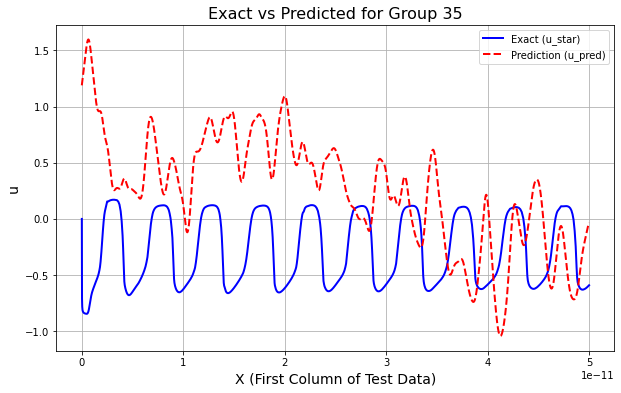

In [369]:
# Step 4: Plot the results
fig = plt.figure(figsize=(10, 6))

plt.plot(X_group_sorted[:, 0], u_group_sorted, 'b-', label='Exact (u_star)', linewidth=2)  # Exact values
plt.plot(X_group_sorted[:, 0], u_pred_group_sorted, 'r--', label='Prediction (u_pred)', linewidth=2)  # Predicted values

plt.xlabel('X (First Column of Test Data)', fontsize=14)
plt.ylabel('u', fontsize=14)
plt.title(f'Exact vs Predicted for Group {specific_group}', fontsize=16)
plt.legend()
plt.grid(True)
plt.show()

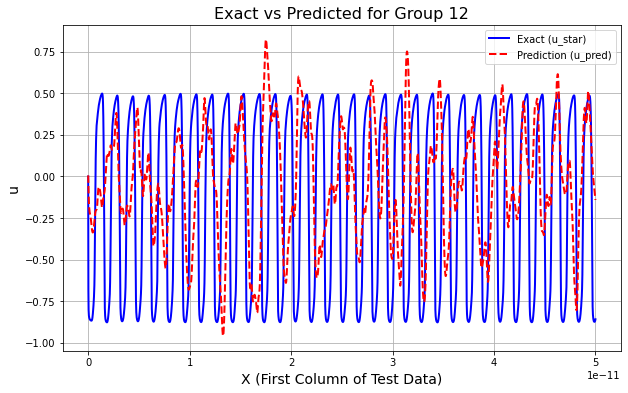

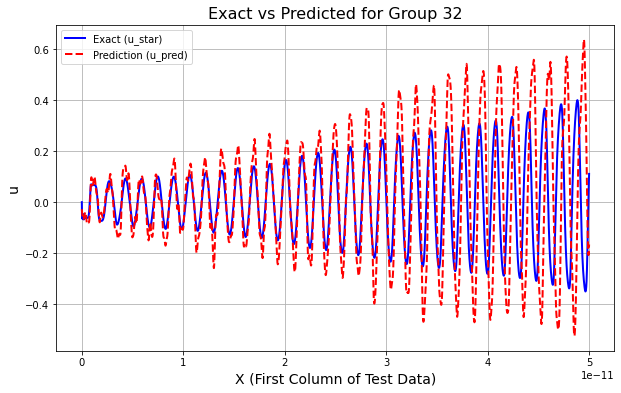

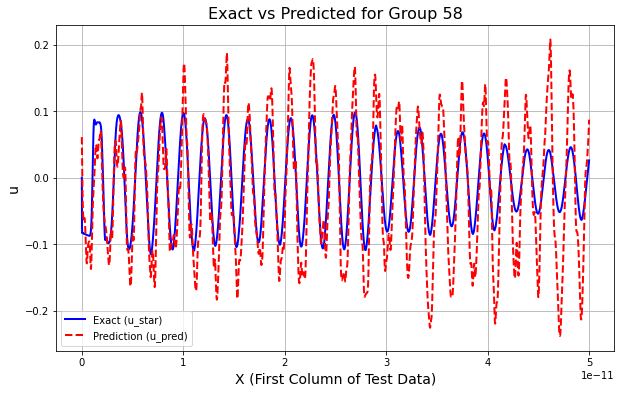

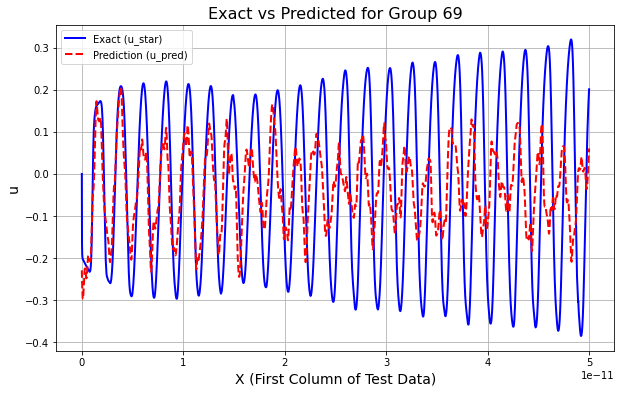

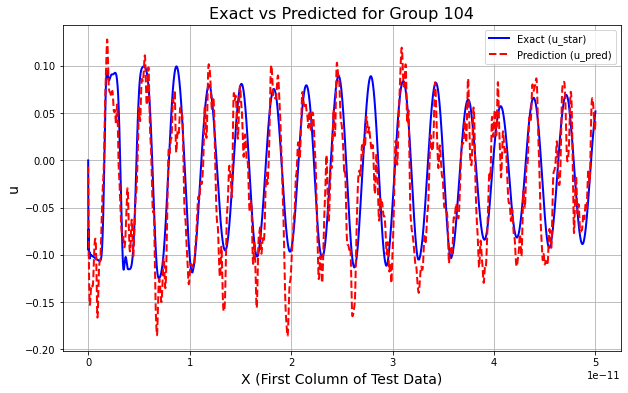

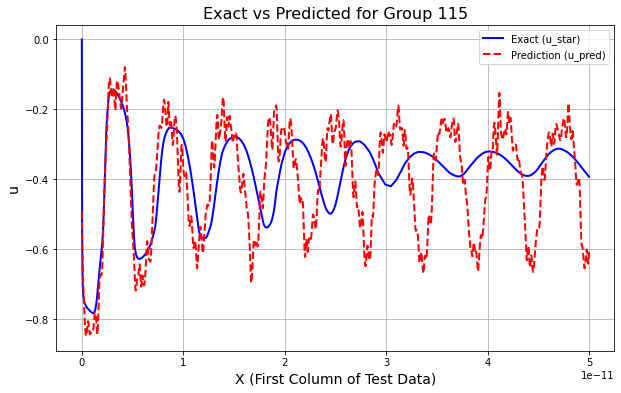

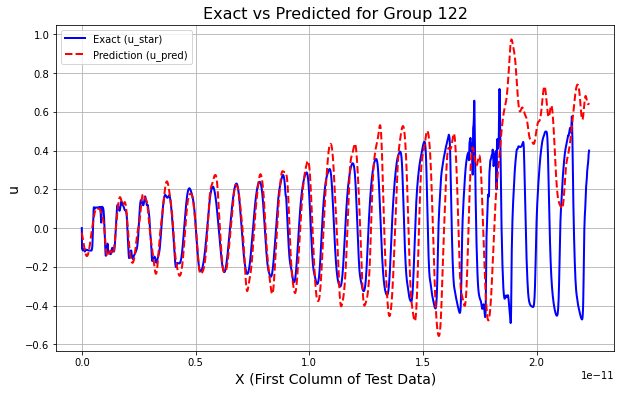

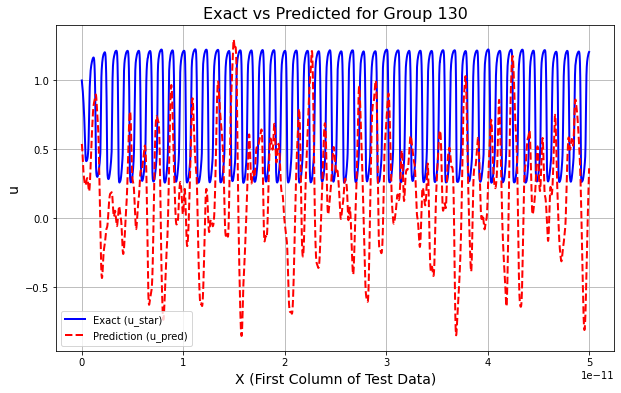

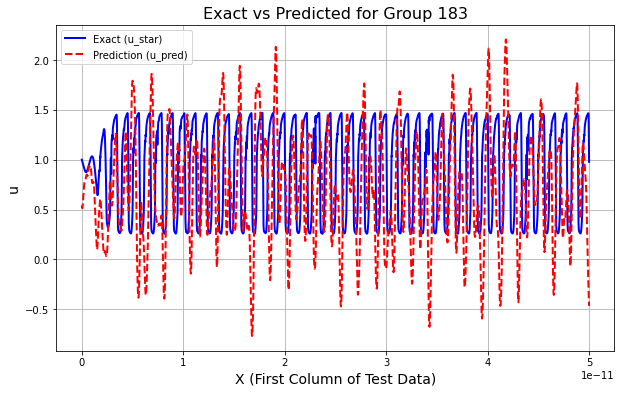

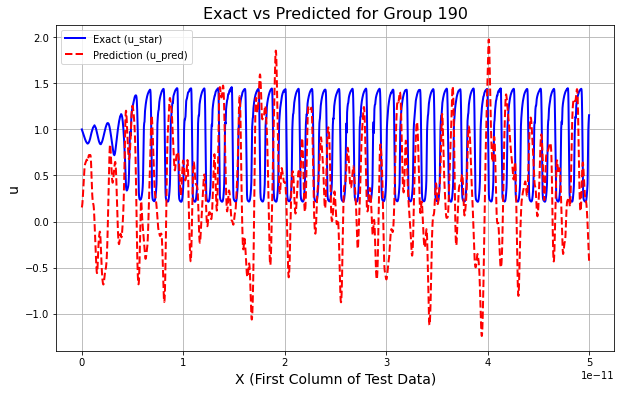

In [14]:
# Get all unique groups from the test data
unique_groups = test_df_with_group['group'].unique()

# Loop through each group and plot
for specific_group in unique_groups:
    # Filter rows belonging to the specific group
    group_df = test_df_with_group[test_df_with_group['group'] == specific_group]

    # Get the corresponding X_star and u_star for the selected group
    X_group = group_df.iloc[:, [0, 2, 3, 4, 5, 6, 7]].values  # X_test for the specific group
    u_group = group_df.iloc[:, 1].values[:, None]  # Y_test (u_star) for the specific group

    # Get predicted values corresponding to these indices from u_pred
    group_indices = group_df.index
    u_pred_group = u_pred[np.isin(test_df_with_group.index, group_indices)]  # Use boolean indexing

    # Sort the values for plotting
    sorted_indices = np.argsort(X_group[:, 0])  # Sort based on the first column (X-axis)
    X_group_sorted = X_group[sorted_indices]
    u_group_sorted = u_group[sorted_indices]
    u_pred_group_sorted = u_pred_group[sorted_indices]

    # Plot the results for the current group
    fig = plt.figure(figsize=(10, 6))
    plt.plot(X_group_sorted[:, 0], u_group_sorted, 'b-', label='Exact (u_star)', linewidth=2)  # Exact values
    plt.plot(X_group_sorted[:, 0], u_pred_group_sorted, 'r--', label='Prediction (u_pred)', linewidth=2)  # Predicted values

    plt.xlabel('X (First Column of Test Data)', fontsize=14)
    plt.ylabel('u', fontsize=14)
    plt.title(f'Exact vs Predicted for Group {specific_group}', fontsize=16)
    plt.legend()
    plt.grid(True)
    plt.show()


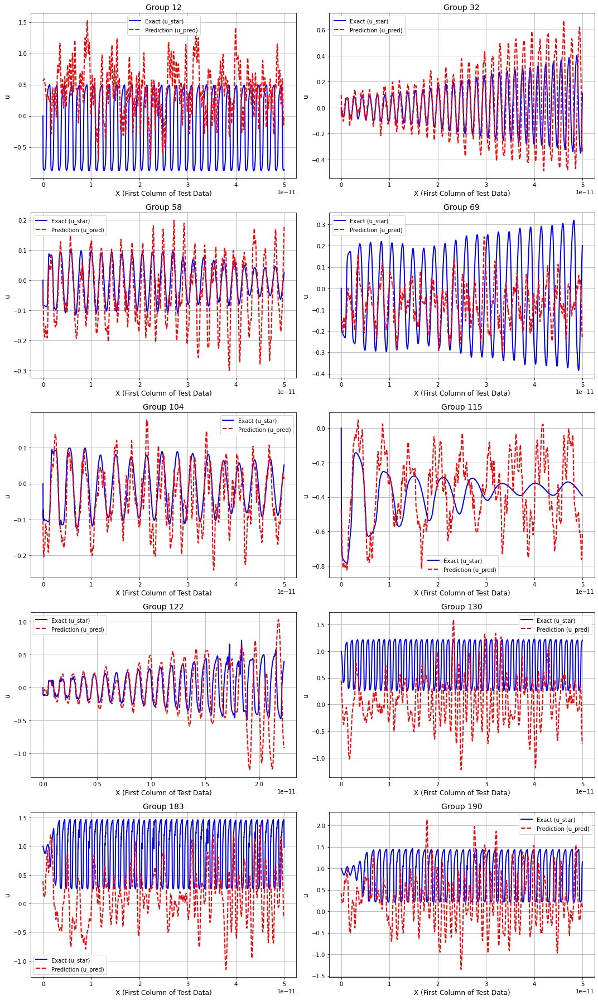

In [20]:
import math

# Get all unique groups from the test data
unique_groups = test_df_with_group['group'].unique()

# Define number of rows and columns for the grid (2 columns)
n_groups = len(unique_groups)
n_cols = 2  # Two columns
n_rows = math.ceil(n_groups / n_cols)  # Calculate the number of rows needed

# Create the figure and axis objects for subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))  # Adjust figure size as needed
axes = axes.flatten()  # Flatten the axes array for easy indexing

# Loop through each group and plot
for i, specific_group in enumerate(unique_groups):
    # Filter rows belonging to the specific group
    group_df = test_df_with_group[test_df_with_group['group'] == specific_group]

    # Get the corresponding X_star and u_star for the selected group
    X_group = group_df.iloc[:, [0, 2, 3, 4, 5, 6, 7]].values  # X_test for the specific group
    u_group = group_df.iloc[:, 1].values[:, None]  # Y_test (u_star) for the specific group

    # Get predicted values corresponding to these indices from u_pred
    group_indices = group_df.index
    u_pred_group = u_pred[np.isin(test_df_with_group.index, group_indices)]  # Use boolean indexing

    # Sort the values for plotting
    sorted_indices = np.argsort(X_group[:, 0])  # Sort based on the first column (X-axis)
    X_group_sorted = X_group[sorted_indices]
    u_group_sorted = u_group[sorted_indices]
    u_pred_group_sorted = u_pred_group[sorted_indices]

    # Plot on the corresponding subplot axis
    ax = axes[i]
    ax.plot(X_group_sorted[:, 0], u_group_sorted, 'b-', label='Exact (u_star)', linewidth=2)
    ax.plot(X_group_sorted[:, 0], u_pred_group_sorted, 'r--', label='Prediction (u_pred)', linewidth=2)

    ax.set_xlabel('X (First Column of Test Data)', fontsize=12)
    ax.set_ylabel('u', fontsize=12)
    ax.set_title(f'Group {specific_group}', fontsize=14)
    ax.legend()
    ax.grid(True)

# Turn off any empty subplots
for j in range(i + 1, n_rows * n_cols):
    fig.delaxes(axes[j])

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


In [21]:
u_pred_train = model.predict_u(X_u)

In [22]:
u_pred_train.shape

(193499, 1)

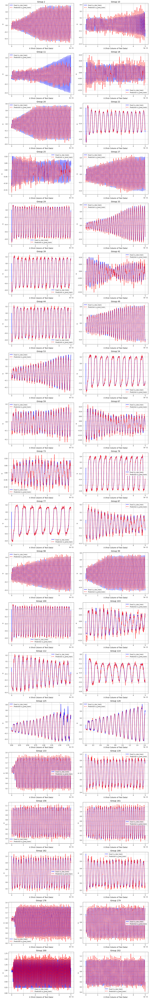

In [23]:
import math

# Get all unique groups from the test data
unique_groups = train_df_with_group['group'].unique()

# Define number of rows and columns for the grid (2 columns)
n_groups = len(unique_groups)
n_cols = 2  # Two columns
n_rows = math.ceil(n_groups / n_cols)  # Calculate the number of rows needed

# Create the figure and axis objects for subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))  # Adjust figure size as needed
axes = axes.flatten()  # Flatten the axes array for easy indexing

# Loop through each group and plot
for i, specific_group in enumerate(unique_groups):
    # Filter rows belonging to the specific group
    group_df = train_df_with_group[train_df_with_group['group'] == specific_group]

    # Get the corresponding X_star and u_star for the selected group
    X_group = group_df.iloc[:, [0, 2, 3, 4, 5, 6, 7]].values  # X_test for the specific group
    u_group = group_df.iloc[:, 1].values[:, None]  # Y_test (u_star) for the specific group

    # Get predicted values corresponding to these indices from u_pred
    group_indices = group_df.index
    u_pred_train_group = u_pred_train[np.isin(train_df_with_group.index, group_indices)]  # Use boolean indexing

    # Sort the values for plotting
    sorted_indices = np.argsort(X_group[:, 0])  # Sort based on the first column (X-axis)
    X_group_sorted = X_group[sorted_indices]
    u_group_sorted = u_group[sorted_indices]
    u_pred_train_group_sorted = u_pred_train_group[sorted_indices]

    # Plot on the corresponding subplot axis
    ax = axes[i]
    ax.plot(X_group_sorted[:, 0], u_group_sorted, 'b-', label='Exact (u_star_train)', linewidth=2)
    ax.plot(X_group_sorted[:, 0], u_pred_train_group_sorted, 'r--', label='Prediction (u_pred_train)', linewidth=2)

    ax.set_xlabel('X (First Column of Test Data)', fontsize=12)
    ax.set_ylabel('u', fontsize=12)
    ax.set_title(f'Group {specific_group}', fontsize=14)
    ax.legend()
    ax.grid(True)

# Turn off any empty subplots
for j in range(i + 1, n_rows * n_cols):
    fig.delaxes(axes[j])

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()
